In [1]:
#####################################################
### STEP 0. Import and define any helper functions
#####################################################

# Load libraries in
# %matplotlib inline
# from pycocotools.coco import COCO
import numpy as np
#import pylab
# import glob
import os
from marqo import Client
from marqo.errors import MarqoApiError
import torch
import pandas as pd
import json
import pprint
import math
import copy
import requests
import shutil # save img locally
import multiprocessing as mp
from multiprocessing import Pool
import PIL
from PIL import Image
import threading
from cairosvg import svg2png
from IPython.display import Image, display

/home/ubuntu/.cache/pypoetry/virtualenvs/marqo-overall-demo-ZTtpq7q_-py3.10/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
ls ~/apebase/ipfs

QmNLijobERK4VhSDZdKjt5SrezdRM6k813qcSHd68f3Mqg
QmNLjZSFV3GUMcusj8keEqVtToEE3ceTSguNom7e4S6pbJ
QmNLoezbXkk37m1DX5iYADRwpqvZ3yfu5UjMG6sndu1AaQ
QmNLtxEYGBw9EqECCbMSXPf8Nofswt3ZxcCJwZRk5NB2Y1
QmNLwvSzvPDyT3CJEjhnuHoevumdJJmG4ZFHkjYFj51ZWH
QmNM3Lk4wDdTe9ejL7S4wE8fK55SQaw14DciPCcd4PWuMr
QmNM48Vm4pKqCuNQuRhBF5UC6d9Wkg6xWA6EZLAD9eLajt
QmNM4yJYz3jMrGSLH1YNeonL63xtbZdC6FT559v6Eyoq1k
QmNMAsXWtQS7nLwLw44oLdDWewqYscisR25YL3taRDkkFh
QmNMCR56431gTCd9Qo6yrMPRgwcf7CQKcZT1rNGS3Yqja6
QmNMCVvKM3cBDnVsCuXqUQjoTNVyLLq18D2CmvskzXKs8v
QmNMRNpMuLESpWnYhkAqaaebdZrGWAy8sP6bohw5xwk9dw
QmNMbhHJZDDf8G1qrhhATTcN2RJdtbA9CZSxhbgA3ytmKB
QmNMjRbzWxPf6eeLC6UiuFecWFmU6Nq18CZutHmD4Gapbm
QmNMoQfVffzdu2sxge7ihZWTN7YoTC2eMr6gJkVRqFmCY1
QmNMzQb9bvzhRE1U4s9gktj8X1HeP3Lee7ZWLgdtsBc8i2
QmNN12KA48FeZWthJxokuworx7ftK7kbUE62xH2QGB4HSi
QmNN44AmZqkMz81KfaGopMg7B2Pn1wfz5W2hGRAXCcmYkQ
QmNN7AkgoEZBBAvegQc9qGSDmomneftpFvcATY9LwSJxXe
QmNN8uoh5D8inydeSF3GhdoLmMbskvAEnuxyCgETyVsB7z
QmNNAocdCGYSQcujK5ZGsTYwKRwoH5TP1Rb3yzMhsEnFo2
QmNNE63me2uha

QmREXHBC8Vnbifa3btJJ2BWXDN1NsyGhv7zFJ4kmUmz9PA
QmREYDSw9DRRM3VzNdcRMm7KKnCNZQoWwq3ZcDddgY7Un7
QmREYmz3mNHiCwuqKWyfqCq8twwbpeb3z7MbwzHv5p9h3v
QmREb5DR5Em82qf2EPAwqWTk3CwMULub7hWFo3LALBZjuz
QmREwPqZpXDhDPAgXFwPu8LwUxUF9rXv9DaeTLTtpz2nB1
QmREwYWxKmcqgFTTXnP4DrcPwiaKaZSPuXL8NkfeyFyHi4
QmREx7oqz595GJYhShZMW14dSUiJ2GjHSHJqrZ7PmrevRj
QmRFBieZwQq31YJWTpP7CQqon5NYWgLaZN7h6JXWcur7rq
QmRFDP1hvXvQZaTBdxWU1Eyr9mJSPZy4Er9KrJNN3MS29G
QmRFEdgEt6sn4psA67jSgxXEWSG1PbCNkATmhQP6HwAYwA
QmRFFpSetqcLYD7ffqCfiWbukec54eXxXmCx6CLMZbkPgU
QmRFMEYDac54MJBoF3ETnYN5AUfKJSmpgjQU73TrjNDw7h
QmRFRyLSN38kq1FXqVqrt9PCTWLDa7NuYMAxCkK3pnSi9w
QmRFUYP2rdQjB6UfB3RkJ67C8aiH6rUVY15jU1AzQdVjPN
QmRFwF8ARNLuZTqyDGbUG68djQVDNPvAEHtuGysEj5csiz
QmRFxbYQ3NvnmgK5AzSvvPX9KyjezzSJt7Wk7eHzGHnu4k
QmRG1LG99syUzKWo3QFtiHPvEQEe9sHDVnCkdGXqxeiiXc
QmRG4BcjfFgX5ubbjW77MgECFYSD4Pt3GNC2TAUrv5Wk8Y
QmRGCrpTf75WMN9gATPQJDLVdGoNyJ6zbT6wMaLNfQsQJd
QmRGMEi1Kh98NShps3Nt2vus5rFGWAEMTfMcP4W35uphJr
QmRGNQJ7vz6ur3uKwnnYnXNek2NFtcMXm9uqNvqkz2tNTp
QmRGVX8Nm5G8w

QmbgFWi5SsoddNV7zcKjhRkieQN3y2g73gpTvR2C6Zu2RY
QmbgMJ71eVHGy9bbowoHRiSwazh52MfVnsCEwToCBJkuks
QmbgNnxyCZAtfVgw2kCmypTdm9LXTRedf5G3wpfja9Q6JT
QmbgUiyXSCj7V2dA7vqAg5yyKgG2mYVgbPcpr7LnnrNb8j
QmbgX56U9uPNecT3Hbg8UvuVNL5fhTRjicXQrrp1sm7bhv
QmbgdjxYoz4RyQX74jBZVe5SV4xvdN1mR1MnXRw7bSE4s3
Qmbgdm7cD9A68ARV8AFEn9iH3b2zwyEi1VfZeuwv377ZHG
QmbggfNm8TpEQYujXuNTdmEPos4T5xM6ReUSJVjfcbNd8e
QmbgjdpuK4hCpEkiAxfugWwHT8wFS4voi2H3MqH4nVSgFg
QmbgtdRDvUCZxU1npeyPtuAbbptCPUsXZx37qCbYarApfU
Qmbgvabrniz5VRbo22yk3R6UqES8kR5tE9jEKvgHektY7D
Qmbgw3FkDUfLLprVKUEjD2SRg3BYARfDswdYmg9W7D9cFu
QmbgxqePkiZZ9CZTj4aE3VRBs19VA19VSxbLxoJBHYv88P
Qmbhbben6v9brFUstDXjpTvcqsDRHQqZcC72kCfLVGk4mo
QmbhrqUM6J1JgRX2VPomHbvxPRdB8Y4EBvWKD9otSLXhVK
QmbhvQestZuRRUY1Ff858hMtCXL6d9XdJLabfB7agrSsWX
Qmbi4K1PCe1Hu2jHC34kbWEXVuTTqjiget6sZAXWv99X5J
Qmbi4xg8Ris7JHaE3NM11dRTdtz6fbFWdV65EXwEENTtFa
QmbiCw3kzHchrV8EZfrPjWoqGPsgFozHkLDmuadu2rpV2u
QmbiKLCpUBAEduAfzCpTMJXj4gEXCA7nLTNjjTH4sJjGWw
QmbiLfr6NsZCEyK3mUcpYWc23s29coFNkYuyzdhbwj1C2u
QmbiQy9mH5ot5

In [2]:
model_data = {
    # Unused, until we index wimple wiki images
    "clip-simple-wiki": {
        "model": "ViT-L/14",
        "non_tensor_fields": ["title", "content", "url", "domain", "docDate"],
        "searchable_attributes": ["image"]
    },
        
    "sbert-simple-wiki": {
        "model": "onnx/all_datasets_v4_MiniLM-L6",
        "searchable_attributes": ["title", "content"],
        "non_tensor_fields": ["image", "url", "domain", "docDate"],
    },
    
    # Focus is the image itself, not the article. We can say the focus is the SECTION
    "sbert-wit": {
        "model": "onnx/all_datasets_v4_MiniLM-L6",
        # Top 4 searchable attributes
        "searchable_attributes": ["page_title", "section_title", "caption_attribution_description", "context_section_description"],
        "non_tensor_fields": ["image_url", "hierarchical_section_title", "caption_reference_description", "caption_alt_text_description", "context_page_description"],
    },
    
    "clip-bored-apes": {
        "model": "ViT-L/14",
        # "non_tensor_fields": ["title", "content", "url", "domain", "docDate"],
        "searchable_attributes": ["image"]
    },
}

index_name_prefix = "marqo-overall-demo"
device = "cuda"

In [2]:
img_list = os.listdir("/home/ubuntu/apebase/ipfs")
ape_docs = []
for i in range(len(img_list)):
    ape_docs.append({"_id": img_list[i].replace(".png", ""),
                    "image": "http://host.docker.internal:8222/" + img_list[i]})

ape_docs

[{'_id': 'QmYAB1LmcCTbbsxJ52dVa4aHmJRie8J7LYVL2A1wDCEkGG',
  'image': 'http://host.docker.internal:8222/QmYAB1LmcCTbbsxJ52dVa4aHmJRie8J7LYVL2A1wDCEkGG.png'},
 {'_id': 'QmNPXVYfwRKEXvoLHFGAV1DSSuwfuDrhhKkK5XxNb3dkD5',
  'image': 'http://host.docker.internal:8222/QmNPXVYfwRKEXvoLHFGAV1DSSuwfuDrhhKkK5XxNb3dkD5.png'},
 {'_id': 'QmX2bLgKCp4yoHhTTyBwpehiP5QwjMmBZXamMVWcVfyK2h',
  'image': 'http://host.docker.internal:8222/QmX2bLgKCp4yoHhTTyBwpehiP5QwjMmBZXamMVWcVfyK2h.png'},
 {'_id': 'QmdkUMQ9VbyqqNgFcGFrocCxvavqcPQsedLDRAozTrMUyN',
  'image': 'http://host.docker.internal:8222/QmdkUMQ9VbyqqNgFcGFrocCxvavqcPQsedLDRAozTrMUyN.png'},
 {'_id': 'QmRAV9xSsQFqrdANdUxYeMqwbYV9q45NMrM8ZKkmbrhqbs',
  'image': 'http://host.docker.internal:8222/QmRAV9xSsQFqrdANdUxYeMqwbYV9q45NMrM8ZKkmbrhqbs.png'},
 {'_id': 'QmYt5B998yVFCPXNQsuBvqz1ffLQMzW8YhWZrANtA5KyLY',
  'image': 'http://host.docker.internal:8222/QmYt5B998yVFCPXNQsuBvqz1ffLQMzW8YhWZrANtA5KyLY.png'},
 {'_id': 'QmdR1CMpNT1ZEHm2FRPXgnNMBfqKQjkt9eMGcqvZKd

In [6]:
index_type = "clip-bored-apes"
index_name = index_name_prefix + "-" + index_type
client = Client()

In [25]:
%%time
# Create the CLIP bored apes Index
index_type = "clip-bored-apes"
settings = {
"treat_urls_and_pointers_as_images":True,   # allows us to find an image file and index it 
"model":"ViT-L/14"
}

try:
    client.create_index(index_name, **settings)
except:
    client.delete_index(index_name)
    client.create_index(index_name, **settings)

CPU times: user 7.32 ms, sys: 0 ns, total: 7.32 ms
Wall time: 400 ms


In [26]:
%%time 
model_data[index_type]["responses"] = client.index(index_name).add_documents(ape_docs, 
                                                                             device=device,
                                                                             client_batch_size=20)

2022-12-05 07:27:38,496 logger:'marqo' INFO starting batch ingestion with batch size 20
2022-12-05 07:27:43,220 logger:'marqo' INFO batch 0: ingested 20 docs. Time taken: 0:00:04.718186. Average timer per doc 0:00:00.235909
2022-12-05 07:27:44,817 logger:'marqo' INFO batch 1: ingested 20 docs. Time taken: 0:00:01.595935. Average timer per doc 0:00:00.079797
2022-12-05 07:27:46,331 logger:'marqo' INFO batch 2: ingested 20 docs. Time taken: 0:00:01.512465. Average timer per doc 0:00:00.075623
2022-12-05 07:27:47,833 logger:'marqo' INFO batch 3: ingested 20 docs. Time taken: 0:00:01.501149. Average timer per doc 0:00:00.075057
2022-12-05 07:27:49,338 logger:'marqo' INFO batch 4: ingested 20 docs. Time taken: 0:00:01.504263. Average timer per doc 0:00:00.075213
2022-12-05 07:27:50,840 logger:'marqo' INFO batch 5: ingested 20 docs. Time taken: 0:00:01.500906. Average timer per doc 0:00:00.075045
2022-12-05 07:27:52,337 logger:'marqo' INFO batch 6: ingested 20 docs. Time taken: 0:00:01.49628

2022-12-05 07:29:13,072 logger:'marqo' INFO batch 60: ingested 20 docs. Time taken: 0:00:01.472048. Average timer per doc 0:00:00.073602
2022-12-05 07:29:14,557 logger:'marqo' INFO batch 61: ingested 20 docs. Time taken: 0:00:01.483447. Average timer per doc 0:00:00.074172
2022-12-05 07:29:16,014 logger:'marqo' INFO batch 62: ingested 20 docs. Time taken: 0:00:01.455957. Average timer per doc 0:00:00.072798
2022-12-05 07:29:17,471 logger:'marqo' INFO batch 63: ingested 20 docs. Time taken: 0:00:01.456192. Average timer per doc 0:00:00.072810
2022-12-05 07:29:18,940 logger:'marqo' INFO batch 64: ingested 20 docs. Time taken: 0:00:01.468889. Average timer per doc 0:00:00.073444
2022-12-05 07:29:20,448 logger:'marqo' INFO batch 65: ingested 20 docs. Time taken: 0:00:01.506823. Average timer per doc 0:00:00.075341
2022-12-05 07:29:21,984 logger:'marqo' INFO batch 66: ingested 20 docs. Time taken: 0:00:01.535241. Average timer per doc 0:00:00.076762
2022-12-05 07:29:23,454 logger:'marqo' IN

2022-12-05 07:30:41,531 logger:'marqo' INFO batch 120: ingested 20 docs. Time taken: 0:00:01.460791. Average timer per doc 0:00:00.073040
2022-12-05 07:30:42,991 logger:'marqo' INFO batch 121: ingested 20 docs. Time taken: 0:00:01.458491. Average timer per doc 0:00:00.072925
2022-12-05 07:30:44,490 logger:'marqo' INFO batch 122: ingested 20 docs. Time taken: 0:00:01.498273. Average timer per doc 0:00:00.074914
2022-12-05 07:30:45,953 logger:'marqo' INFO batch 123: ingested 20 docs. Time taken: 0:00:01.462752. Average timer per doc 0:00:00.073138
2022-12-05 07:30:47,430 logger:'marqo' INFO batch 124: ingested 20 docs. Time taken: 0:00:01.476578. Average timer per doc 0:00:00.073829
2022-12-05 07:30:48,901 logger:'marqo' INFO batch 125: ingested 20 docs. Time taken: 0:00:01.467969. Average timer per doc 0:00:00.073398
2022-12-05 07:30:50,369 logger:'marqo' INFO batch 126: ingested 20 docs. Time taken: 0:00:01.466955. Average timer per doc 0:00:00.073348
2022-12-05 07:30:51,890 logger:'ma

2022-12-05 07:32:10,229 logger:'marqo' INFO batch 180: ingested 20 docs. Time taken: 0:00:01.445516. Average timer per doc 0:00:00.072276
2022-12-05 07:32:11,689 logger:'marqo' INFO batch 181: ingested 20 docs. Time taken: 0:00:01.458962. Average timer per doc 0:00:00.072948
2022-12-05 07:32:13,170 logger:'marqo' INFO batch 182: ingested 20 docs. Time taken: 0:00:01.480477. Average timer per doc 0:00:00.074024
2022-12-05 07:32:14,627 logger:'marqo' INFO batch 183: ingested 20 docs. Time taken: 0:00:01.455374. Average timer per doc 0:00:00.072769
2022-12-05 07:32:16,097 logger:'marqo' INFO batch 184: ingested 20 docs. Time taken: 0:00:01.469582. Average timer per doc 0:00:00.073479
2022-12-05 07:32:17,573 logger:'marqo' INFO batch 185: ingested 20 docs. Time taken: 0:00:01.475319. Average timer per doc 0:00:00.073766
2022-12-05 07:32:19,018 logger:'marqo' INFO batch 186: ingested 20 docs. Time taken: 0:00:01.444191. Average timer per doc 0:00:00.072210
2022-12-05 07:32:20,461 logger:'ma

2022-12-05 07:33:38,152 logger:'marqo' INFO batch 240: ingested 20 docs. Time taken: 0:00:01.443441. Average timer per doc 0:00:00.072172
2022-12-05 07:33:39,626 logger:'marqo' INFO batch 241: ingested 20 docs. Time taken: 0:00:01.472518. Average timer per doc 0:00:00.073626
2022-12-05 07:33:41,070 logger:'marqo' INFO batch 242: ingested 20 docs. Time taken: 0:00:01.443669. Average timer per doc 0:00:00.072183
2022-12-05 07:33:42,703 logger:'marqo' INFO batch 243: ingested 20 docs. Time taken: 0:00:01.632299. Average timer per doc 0:00:00.081615
2022-12-05 07:33:44,255 logger:'marqo' INFO batch 244: ingested 20 docs. Time taken: 0:00:01.550903. Average timer per doc 0:00:00.077545
2022-12-05 07:33:45,738 logger:'marqo' INFO batch 245: ingested 20 docs. Time taken: 0:00:01.481904. Average timer per doc 0:00:00.074095
2022-12-05 07:33:47,215 logger:'marqo' INFO batch 246: ingested 20 docs. Time taken: 0:00:01.477106. Average timer per doc 0:00:00.073855
2022-12-05 07:33:48,731 logger:'ma

2022-12-05 07:35:06,484 logger:'marqo' INFO batch 300: ingested 20 docs. Time taken: 0:00:01.499028. Average timer per doc 0:00:00.074951
2022-12-05 07:35:07,972 logger:'marqo' INFO batch 301: ingested 20 docs. Time taken: 0:00:01.487597. Average timer per doc 0:00:00.074380
2022-12-05 07:35:09,482 logger:'marqo' INFO batch 302: ingested 20 docs. Time taken: 0:00:01.508635. Average timer per doc 0:00:00.075432
2022-12-05 07:35:10,920 logger:'marqo' INFO batch 303: ingested 20 docs. Time taken: 0:00:01.437223. Average timer per doc 0:00:00.071861
2022-12-05 07:35:12,360 logger:'marqo' INFO batch 304: ingested 20 docs. Time taken: 0:00:01.439599. Average timer per doc 0:00:00.071980
2022-12-05 07:35:13,819 logger:'marqo' INFO batch 305: ingested 20 docs. Time taken: 0:00:01.458224. Average timer per doc 0:00:00.072911
2022-12-05 07:35:15,271 logger:'marqo' INFO batch 306: ingested 20 docs. Time taken: 0:00:01.450392. Average timer per doc 0:00:00.072520
2022-12-05 07:35:16,718 logger:'ma

2022-12-05 07:36:33,828 logger:'marqo' INFO batch 360: ingested 20 docs. Time taken: 0:00:01.511267. Average timer per doc 0:00:00.075563
2022-12-05 07:36:35,440 logger:'marqo' INFO batch 361: ingested 20 docs. Time taken: 0:00:01.608547. Average timer per doc 0:00:00.080427
2022-12-05 07:36:36,958 logger:'marqo' INFO batch 362: ingested 20 docs. Time taken: 0:00:01.516724. Average timer per doc 0:00:00.075836
2022-12-05 07:36:38,426 logger:'marqo' INFO batch 363: ingested 20 docs. Time taken: 0:00:01.467326. Average timer per doc 0:00:00.073366
2022-12-05 07:36:39,935 logger:'marqo' INFO batch 364: ingested 20 docs. Time taken: 0:00:01.507859. Average timer per doc 0:00:00.075393
2022-12-05 07:36:41,404 logger:'marqo' INFO batch 365: ingested 20 docs. Time taken: 0:00:01.467506. Average timer per doc 0:00:00.073375
2022-12-05 07:36:42,861 logger:'marqo' INFO batch 366: ingested 20 docs. Time taken: 0:00:01.456177. Average timer per doc 0:00:00.072809
2022-12-05 07:36:44,312 logger:'ma

2022-12-05 07:38:02,362 logger:'marqo' INFO batch 420: ingested 20 docs. Time taken: 0:00:01.464783. Average timer per doc 0:00:00.073239
2022-12-05 07:38:03,842 logger:'marqo' INFO batch 421: ingested 20 docs. Time taken: 0:00:01.479295. Average timer per doc 0:00:00.073965
2022-12-05 07:38:05,316 logger:'marqo' INFO batch 422: ingested 20 docs. Time taken: 0:00:01.473530. Average timer per doc 0:00:00.073676
2022-12-05 07:38:06,783 logger:'marqo' INFO batch 423: ingested 20 docs. Time taken: 0:00:01.466229. Average timer per doc 0:00:00.073311
2022-12-05 07:38:08,260 logger:'marqo' INFO batch 424: ingested 20 docs. Time taken: 0:00:01.476290. Average timer per doc 0:00:00.073814
2022-12-05 07:38:09,781 logger:'marqo' INFO batch 425: ingested 20 docs. Time taken: 0:00:01.520159. Average timer per doc 0:00:00.076008
2022-12-05 07:38:11,338 logger:'marqo' INFO batch 426: ingested 20 docs. Time taken: 0:00:01.555733. Average timer per doc 0:00:00.077787
2022-12-05 07:38:12,834 logger:'ma

2022-12-05 07:39:32,619 logger:'marqo' INFO batch 480: ingested 20 docs. Time taken: 0:00:01.495989. Average timer per doc 0:00:00.074799
2022-12-05 07:39:34,120 logger:'marqo' INFO batch 481: ingested 20 docs. Time taken: 0:00:01.500355. Average timer per doc 0:00:00.075018
2022-12-05 07:39:35,616 logger:'marqo' INFO batch 482: ingested 20 docs. Time taken: 0:00:01.495712. Average timer per doc 0:00:00.074786
2022-12-05 07:39:37,113 logger:'marqo' INFO batch 483: ingested 20 docs. Time taken: 0:00:01.495771. Average timer per doc 0:00:00.074789
2022-12-05 07:39:38,615 logger:'marqo' INFO batch 484: ingested 20 docs. Time taken: 0:00:01.500763. Average timer per doc 0:00:00.075038
2022-12-05 07:39:40,123 logger:'marqo' INFO batch 485: ingested 20 docs. Time taken: 0:00:01.507592. Average timer per doc 0:00:00.075380
2022-12-05 07:39:41,623 logger:'marqo' INFO batch 486: ingested 20 docs. Time taken: 0:00:01.498886. Average timer per doc 0:00:00.074944
2022-12-05 07:39:43,122 logger:'ma

## Marqo Cloud Indexing

In [5]:
# Joshua endpoint + API
marqo_endpoint_url = "https://i4v3alutrc.execute-api.us-east-1.amazonaws.com/prod"
api_key = "zTGRgzOOiL42EfS8PIErx5qIdLRxFTmi3Ol8ZL2F"
client = Client(url=marqo_endpoint_url, api_key=api_key)

In [11]:
settings = {
    "treat_urls_and_pointers_as_images": True,   # allows us to find an image file and index it 
    "model": "ViT-L/14",
}

client.create_index("joshua-overall-demo-bored-apes", **settings)

{'acknowledged': True,
 'index': 'joshua-overall-demo-bored-apes',
 'shards_acknowledged': True}

In [6]:
# Accessing the S3-hosted images

img_list = os.listdir("/home/ubuntu/apebase/ipfs")

cloud_ape_docs = []
for i in range(len(img_list)):
    cloud_ape_docs.append({"_id": img_list[i].replace(".png", ""),
                            "image": "https://marqo-overall-demo-assets.s3.us-west-2.amazonaws.com/ipfs/" + img_list[i]})  
cloud_ape_docs

[{'_id': 'QmYAB1LmcCTbbsxJ52dVa4aHmJRie8J7LYVL2A1wDCEkGG',
  'image': 'https://marqo-overall-demo-assets.s3.us-west-2.amazonaws.com/ipfs/QmYAB1LmcCTbbsxJ52dVa4aHmJRie8J7LYVL2A1wDCEkGG.png'},
 {'_id': 'QmNPXVYfwRKEXvoLHFGAV1DSSuwfuDrhhKkK5XxNb3dkD5',
  'image': 'https://marqo-overall-demo-assets.s3.us-west-2.amazonaws.com/ipfs/QmNPXVYfwRKEXvoLHFGAV1DSSuwfuDrhhKkK5XxNb3dkD5.png'},
 {'_id': 'QmX2bLgKCp4yoHhTTyBwpehiP5QwjMmBZXamMVWcVfyK2h',
  'image': 'https://marqo-overall-demo-assets.s3.us-west-2.amazonaws.com/ipfs/QmX2bLgKCp4yoHhTTyBwpehiP5QwjMmBZXamMVWcVfyK2h.png'},
 {'_id': 'QmdkUMQ9VbyqqNgFcGFrocCxvavqcPQsedLDRAozTrMUyN',
  'image': 'https://marqo-overall-demo-assets.s3.us-west-2.amazonaws.com/ipfs/QmdkUMQ9VbyqqNgFcGFrocCxvavqcPQsedLDRAozTrMUyN.png'},
 {'_id': 'QmRAV9xSsQFqrdANdUxYeMqwbYV9q45NMrM8ZKkmbrhqbs',
  'image': 'https://marqo-overall-demo-assets.s3.us-west-2.amazonaws.com/ipfs/QmRAV9xSsQFqrdANdUxYeMqwbYV9q45NMrM8ZKkmbrhqbs.png'},
 {'_id': 'QmYt5B998yVFCPXNQsuBvqz1ffLQMzW8YhW

In [7]:
cloud_bored_apes_responses = client.index("joshua-overall-demo-bored-apes").add_documents(cloud_ape_docs, 
                                                                                         device="cuda",
                                                                                         client_batch_size=20)

2022-12-07 08:01:35,973 logger:'marqo' INFO starting batch ingestion with batch size 20
2022-12-07 08:01:50,730 logger:'marqo' INFO batch 0: ingested 20 docs. Time taken: 0:00:14.751802. Average timer per doc 0:00:00.737590
2022-12-07 08:02:03,926 logger:'marqo' INFO batch 1: ingested 20 docs. Time taken: 0:00:13.195039. Average timer per doc 0:00:00.659752
2022-12-07 08:02:17,709 logger:'marqo' INFO batch 2: ingested 20 docs. Time taken: 0:00:13.782152. Average timer per doc 0:00:00.689108
2022-12-07 08:02:30,933 logger:'marqo' INFO batch 3: ingested 20 docs. Time taken: 0:00:13.224020. Average timer per doc 0:00:00.661201
2022-12-07 08:02:43,811 logger:'marqo' INFO batch 4: ingested 20 docs. Time taken: 0:00:12.876435. Average timer per doc 0:00:00.643822
2022-12-07 08:02:56,878 logger:'marqo' INFO batch 5: ingested 20 docs. Time taken: 0:00:13.066585. Average timer per doc 0:00:00.653329
2022-12-07 08:03:09,976 logger:'marqo' INFO batch 6: ingested 20 docs. Time taken: 0:00:13.09740

2022-12-07 08:14:55,420 logger:'marqo' INFO batch 60: ingested 20 docs. Time taken: 0:00:13.013361. Average timer per doc 0:00:00.650668
2022-12-07 08:15:08,252 logger:'marqo' INFO batch 61: ingested 20 docs. Time taken: 0:00:12.831553. Average timer per doc 0:00:00.641578
2022-12-07 08:15:21,438 logger:'marqo' INFO batch 62: ingested 20 docs. Time taken: 0:00:13.184758. Average timer per doc 0:00:00.659238
2022-12-07 08:15:34,371 logger:'marqo' INFO batch 63: ingested 20 docs. Time taken: 0:00:12.932381. Average timer per doc 0:00:00.646619
2022-12-07 08:15:47,623 logger:'marqo' INFO batch 64: ingested 20 docs. Time taken: 0:00:13.251634. Average timer per doc 0:00:00.662582
2022-12-07 08:16:00,667 logger:'marqo' INFO batch 65: ingested 20 docs. Time taken: 0:00:13.042922. Average timer per doc 0:00:00.652146
2022-12-07 08:16:13,457 logger:'marqo' INFO batch 66: ingested 20 docs. Time taken: 0:00:12.789130. Average timer per doc 0:00:00.639456
2022-12-07 08:16:26,789 logger:'marqo' IN

2022-12-07 08:27:58,646 logger:'marqo' INFO batch 120: ingested 20 docs. Time taken: 0:00:13.165086. Average timer per doc 0:00:00.658254
2022-12-07 08:28:11,697 logger:'marqo' INFO batch 121: ingested 20 docs. Time taken: 0:00:13.049910. Average timer per doc 0:00:00.652496
2022-12-07 08:28:24,875 logger:'marqo' INFO batch 122: ingested 20 docs. Time taken: 0:00:13.177771. Average timer per doc 0:00:00.658889
2022-12-07 08:28:37,863 logger:'marqo' INFO batch 123: ingested 20 docs. Time taken: 0:00:12.986646. Average timer per doc 0:00:00.649332
2022-12-07 08:28:51,010 logger:'marqo' INFO batch 124: ingested 20 docs. Time taken: 0:00:13.145989. Average timer per doc 0:00:00.657299
2022-12-07 08:29:04,069 logger:'marqo' INFO batch 125: ingested 20 docs. Time taken: 0:00:13.058453. Average timer per doc 0:00:00.652923
2022-12-07 08:29:17,262 logger:'marqo' INFO batch 126: ingested 20 docs. Time taken: 0:00:13.192370. Average timer per doc 0:00:00.659618
2022-12-07 08:29:30,061 logger:'ma

2022-12-07 08:40:57,621 logger:'marqo' INFO batch 180: ingested 20 docs. Time taken: 0:00:12.679972. Average timer per doc 0:00:00.633999
2022-12-07 08:41:10,650 logger:'marqo' INFO batch 181: ingested 20 docs. Time taken: 0:00:13.028911. Average timer per doc 0:00:00.651446
2022-12-07 08:41:23,637 logger:'marqo' INFO batch 182: ingested 20 docs. Time taken: 0:00:12.986250. Average timer per doc 0:00:00.649312
2022-12-07 08:41:36,759 logger:'marqo' INFO batch 183: ingested 20 docs. Time taken: 0:00:13.120989. Average timer per doc 0:00:00.656049
2022-12-07 08:41:49,556 logger:'marqo' INFO batch 184: ingested 20 docs. Time taken: 0:00:12.796511. Average timer per doc 0:00:00.639826
2022-12-07 08:42:02,646 logger:'marqo' INFO batch 185: ingested 20 docs. Time taken: 0:00:13.089225. Average timer per doc 0:00:00.654461
2022-12-07 08:42:15,481 logger:'marqo' INFO batch 186: ingested 20 docs. Time taken: 0:00:12.833895. Average timer per doc 0:00:00.641695
2022-12-07 08:42:28,169 logger:'ma

2022-12-07 08:53:55,371 logger:'marqo' INFO batch 240: ingested 20 docs. Time taken: 0:00:13.063342. Average timer per doc 0:00:00.653167
2022-12-07 08:54:07,814 logger:'marqo' INFO batch 241: ingested 20 docs. Time taken: 0:00:12.443090. Average timer per doc 0:00:00.622154
2022-12-07 08:54:20,555 logger:'marqo' INFO batch 242: ingested 20 docs. Time taken: 0:00:12.740050. Average timer per doc 0:00:00.637002
2022-12-07 08:54:33,445 logger:'marqo' INFO batch 243: ingested 20 docs. Time taken: 0:00:12.889359. Average timer per doc 0:00:00.644468
2022-12-07 08:54:46,206 logger:'marqo' INFO batch 244: ingested 20 docs. Time taken: 0:00:12.759684. Average timer per doc 0:00:00.637984
2022-12-07 08:54:59,125 logger:'marqo' INFO batch 245: ingested 20 docs. Time taken: 0:00:12.918380. Average timer per doc 0:00:00.645919
2022-12-07 08:55:12,541 logger:'marqo' INFO batch 246: ingested 20 docs. Time taken: 0:00:13.415578. Average timer per doc 0:00:00.670779
2022-12-07 08:55:25,547 logger:'ma

2022-12-07 09:06:55,544 logger:'marqo' INFO batch 300: ingested 20 docs. Time taken: 0:00:12.800232. Average timer per doc 0:00:00.640012
2022-12-07 09:07:08,376 logger:'marqo' INFO batch 301: ingested 20 docs. Time taken: 0:00:12.831690. Average timer per doc 0:00:00.641584
2022-12-07 09:07:21,566 logger:'marqo' INFO batch 302: ingested 20 docs. Time taken: 0:00:13.189445. Average timer per doc 0:00:00.659472
2022-12-07 09:07:34,623 logger:'marqo' INFO batch 303: ingested 20 docs. Time taken: 0:00:13.056349. Average timer per doc 0:00:00.652817
2022-12-07 09:07:47,376 logger:'marqo' INFO batch 304: ingested 20 docs. Time taken: 0:00:12.751224. Average timer per doc 0:00:00.637561
2022-12-07 09:08:00,637 logger:'marqo' INFO batch 305: ingested 20 docs. Time taken: 0:00:13.261264. Average timer per doc 0:00:00.663063
2022-12-07 09:08:13,554 logger:'marqo' INFO batch 306: ingested 20 docs. Time taken: 0:00:12.915783. Average timer per doc 0:00:00.645789
2022-12-07 09:08:26,794 logger:'ma

2022-12-07 09:19:57,736 logger:'marqo' INFO batch 360: ingested 20 docs. Time taken: 0:00:12.964475. Average timer per doc 0:00:00.648224
2022-12-07 09:20:10,813 logger:'marqo' INFO batch 361: ingested 20 docs. Time taken: 0:00:13.076638. Average timer per doc 0:00:00.653832
2022-12-07 09:20:23,831 logger:'marqo' INFO batch 362: ingested 20 docs. Time taken: 0:00:13.017129. Average timer per doc 0:00:00.650856
2022-12-07 09:20:37,275 logger:'marqo' INFO batch 363: ingested 20 docs. Time taken: 0:00:13.442973. Average timer per doc 0:00:00.672149
2022-12-07 09:20:50,338 logger:'marqo' INFO batch 364: ingested 20 docs. Time taken: 0:00:13.061666. Average timer per doc 0:00:00.653083
2022-12-07 09:21:03,423 logger:'marqo' INFO batch 365: ingested 20 docs. Time taken: 0:00:13.084687. Average timer per doc 0:00:00.654234
2022-12-07 09:21:16,460 logger:'marqo' INFO batch 366: ingested 20 docs. Time taken: 0:00:13.036328. Average timer per doc 0:00:00.651816
2022-12-07 09:21:29,314 logger:'ma

2022-12-07 09:32:57,451 logger:'marqo' INFO batch 420: ingested 20 docs. Time taken: 0:00:13.091667. Average timer per doc 0:00:00.654583
2022-12-07 09:33:10,580 logger:'marqo' INFO batch 421: ingested 20 docs. Time taken: 0:00:13.127992. Average timer per doc 0:00:00.656400
2022-12-07 09:33:23,470 logger:'marqo' INFO batch 422: ingested 20 docs. Time taken: 0:00:12.888944. Average timer per doc 0:00:00.644447
2022-12-07 09:33:36,131 logger:'marqo' INFO batch 423: ingested 20 docs. Time taken: 0:00:12.660603. Average timer per doc 0:00:00.633030
2022-12-07 09:33:49,032 logger:'marqo' INFO batch 424: ingested 20 docs. Time taken: 0:00:12.899631. Average timer per doc 0:00:00.644982
2022-12-07 09:34:01,678 logger:'marqo' INFO batch 425: ingested 20 docs. Time taken: 0:00:12.645773. Average timer per doc 0:00:00.632289
2022-12-07 09:34:15,250 logger:'marqo' INFO batch 426: ingested 20 docs. Time taken: 0:00:13.571315. Average timer per doc 0:00:00.678566
2022-12-07 09:34:28,399 logger:'ma

2022-12-07 09:45:56,569 logger:'marqo' INFO batch 480: ingested 20 docs. Time taken: 0:00:13.030292. Average timer per doc 0:00:00.651515
2022-12-07 09:46:09,651 logger:'marqo' INFO batch 481: ingested 20 docs. Time taken: 0:00:13.081078. Average timer per doc 0:00:00.654054
2022-12-07 09:46:22,609 logger:'marqo' INFO batch 482: ingested 20 docs. Time taken: 0:00:12.957298. Average timer per doc 0:00:00.647865
2022-12-07 09:46:35,502 logger:'marqo' INFO batch 483: ingested 20 docs. Time taken: 0:00:12.892383. Average timer per doc 0:00:00.644619
2022-12-07 09:46:48,738 logger:'marqo' INFO batch 484: ingested 20 docs. Time taken: 0:00:13.235842. Average timer per doc 0:00:00.661792
2022-12-07 09:47:01,746 logger:'marqo' INFO batch 485: ingested 20 docs. Time taken: 0:00:13.006817. Average timer per doc 0:00:00.650341
2022-12-07 09:47:14,243 logger:'marqo' INFO batch 486: ingested 20 docs. Time taken: 0:00:12.496924. Average timer per doc 0:00:00.624846
2022-12-07 09:47:27,339 logger:'ma

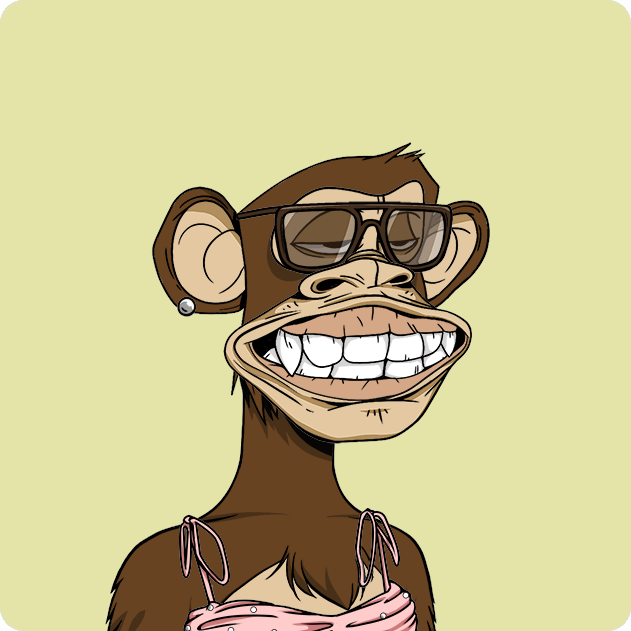

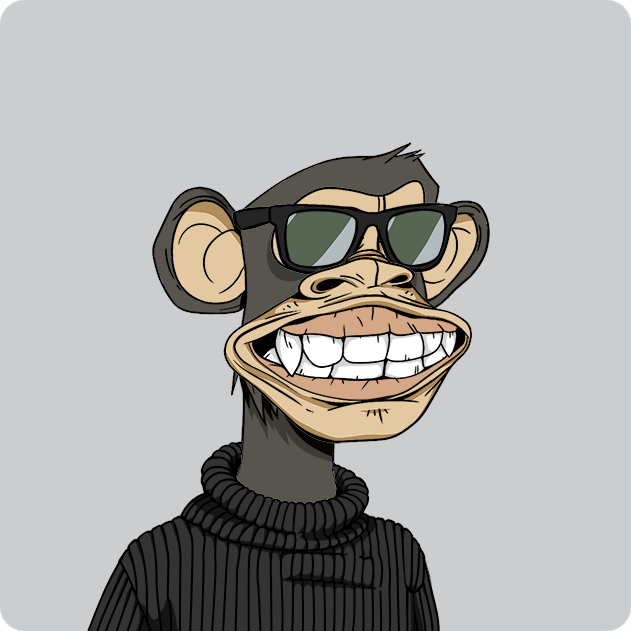

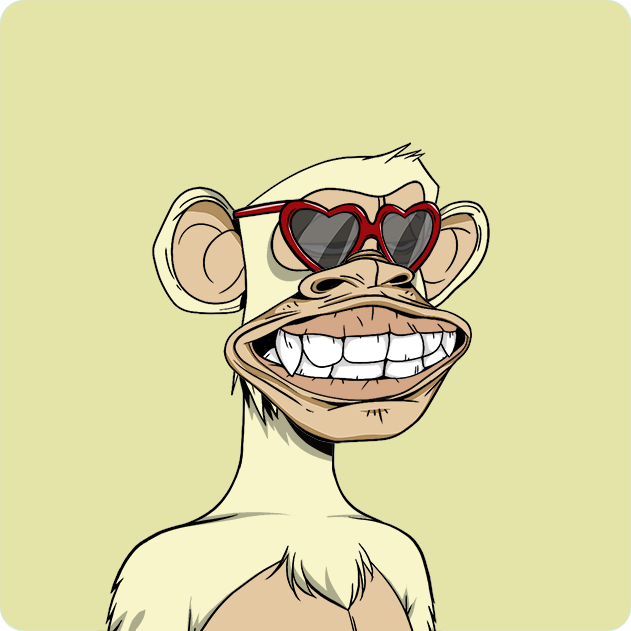

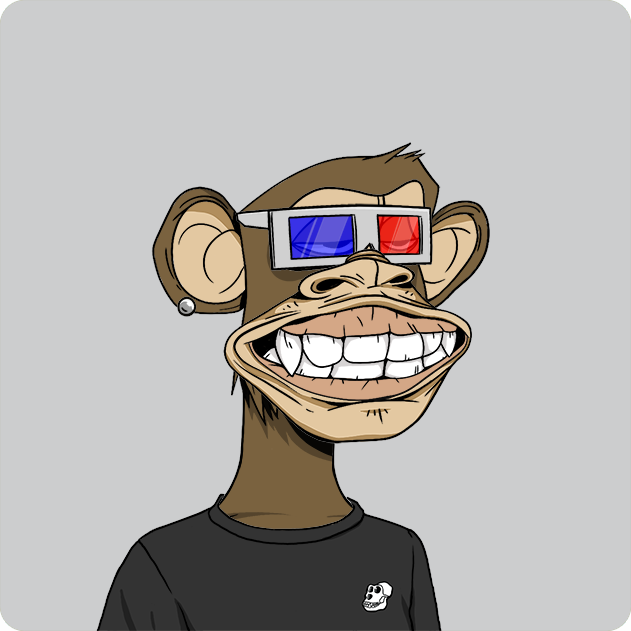

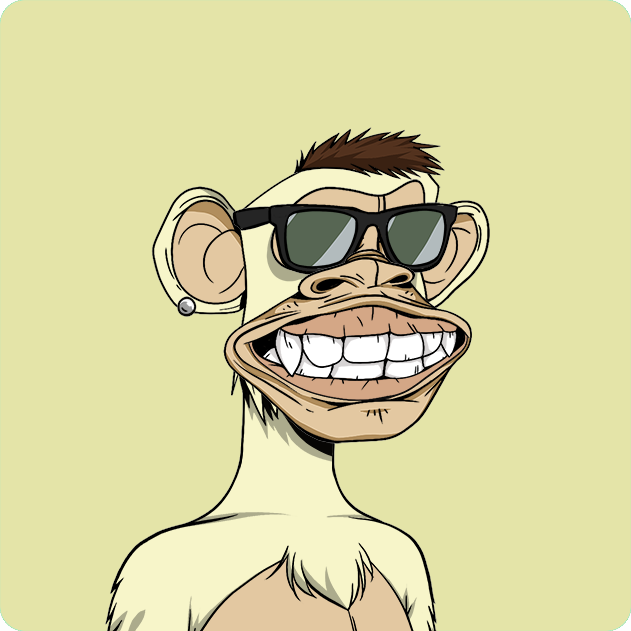

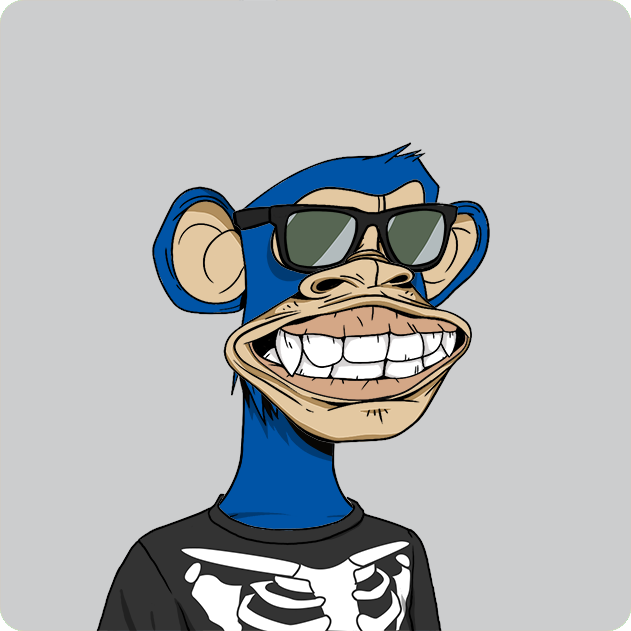

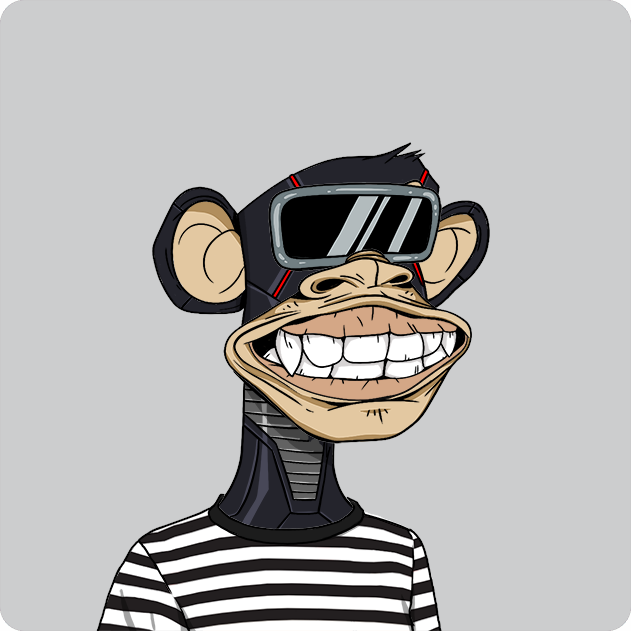

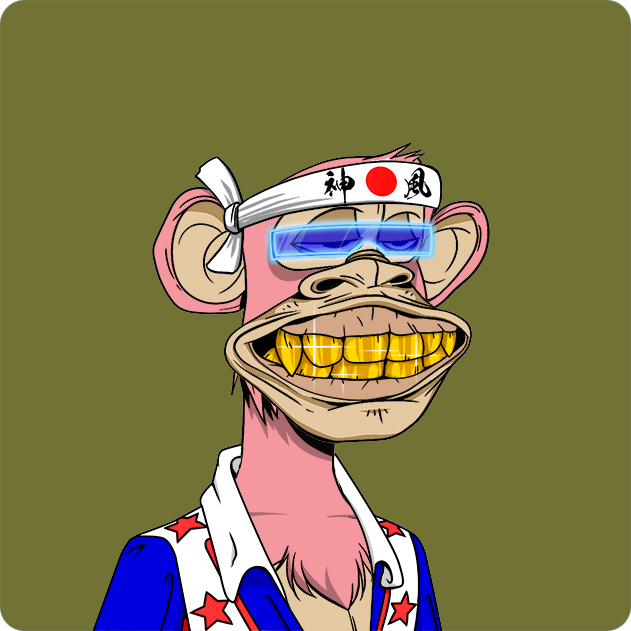

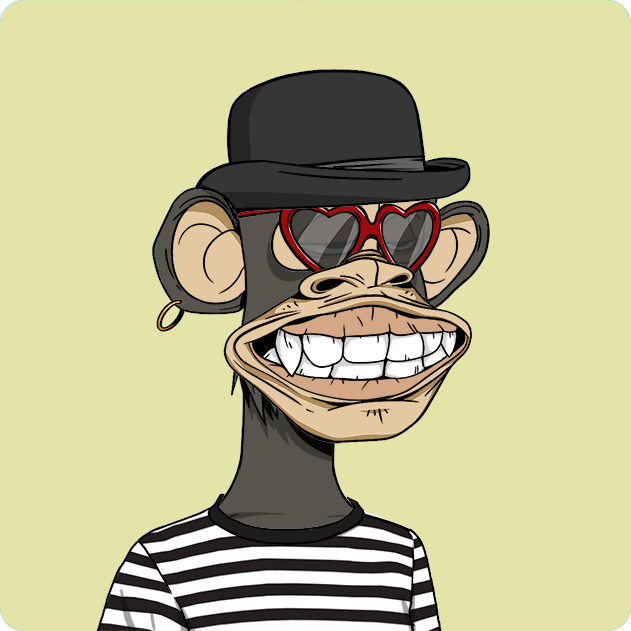

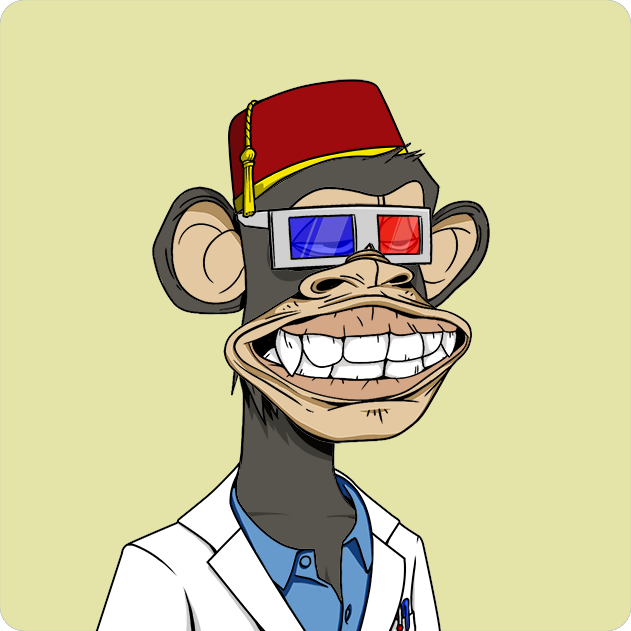

CPU times: user 63.9 ms, sys: 0 ns, total: 63.9 ms
Wall time: 251 ms


In [50]:
%%time
from IPython.display import Image
query = 'smiling with glasses'
results = client.index(index_name).search(query, 
                                          device=device,
                                         )


for i in range(10):
    #print("RESULT: ", str(i))
    #print("URL: https://ipfs.io/ipfs/" + results['hits'][i]["_id"])
    display(Image("/home/ubuntu/apebase/ipfs/" + results['hits'][i]["_id"] + ".png", width=200))
    #print("")
    

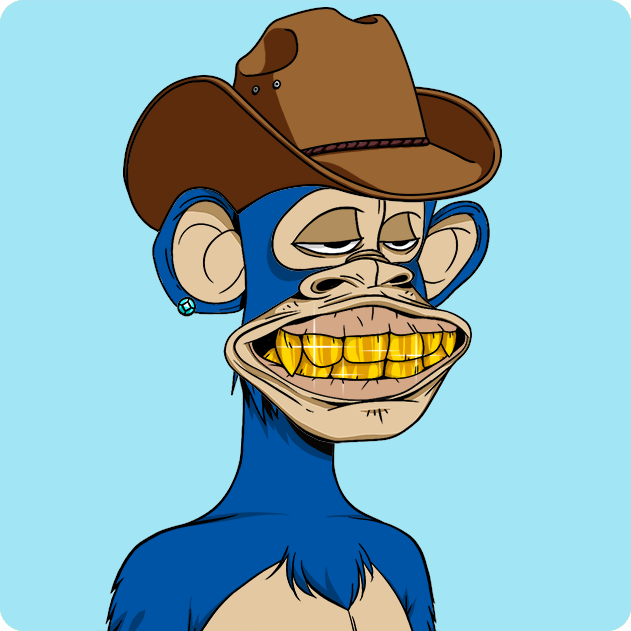

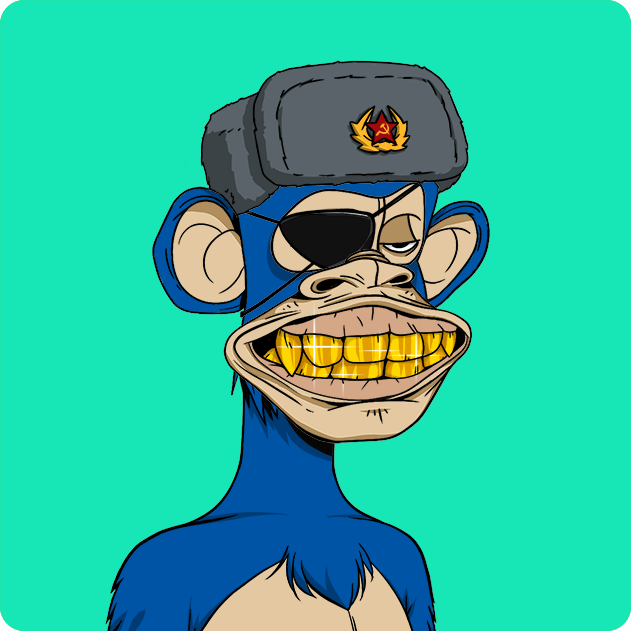

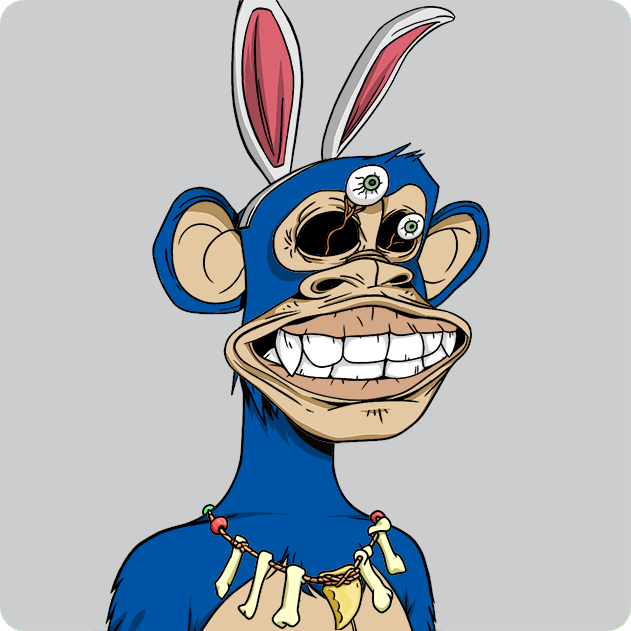

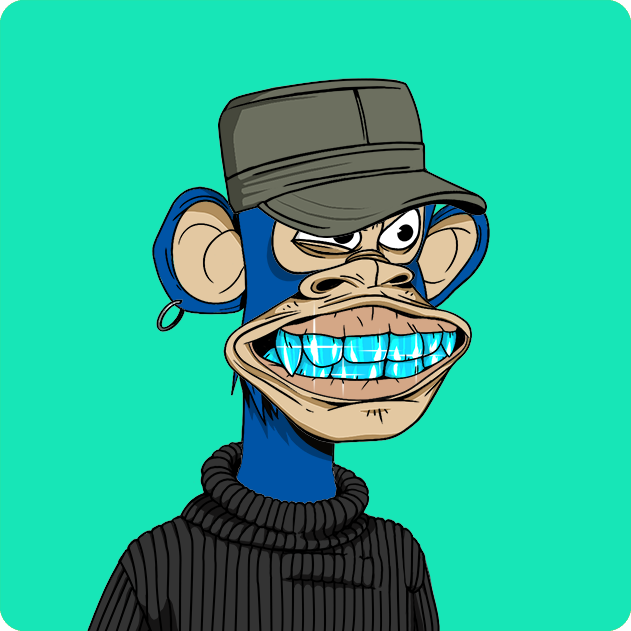

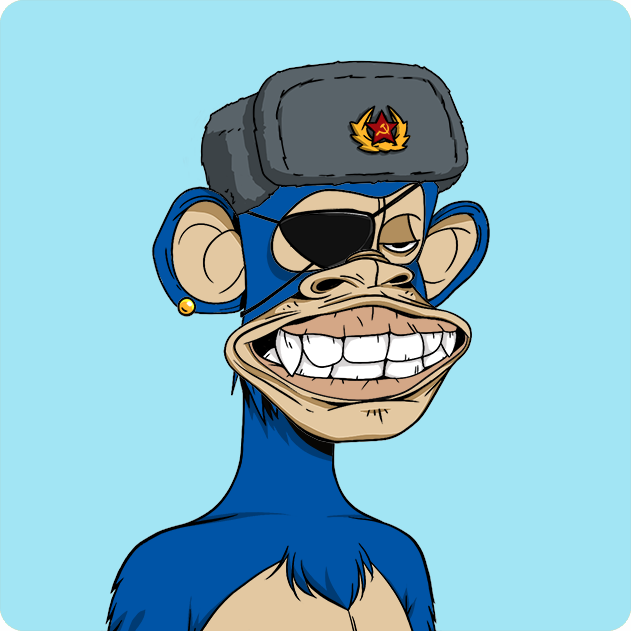

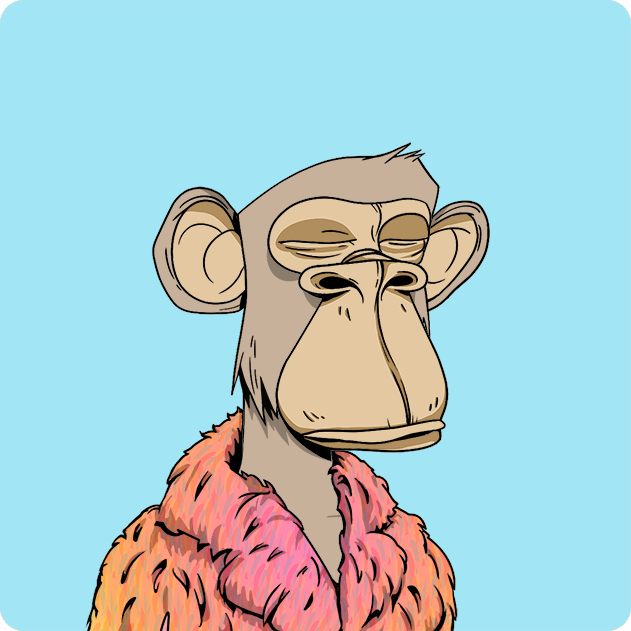

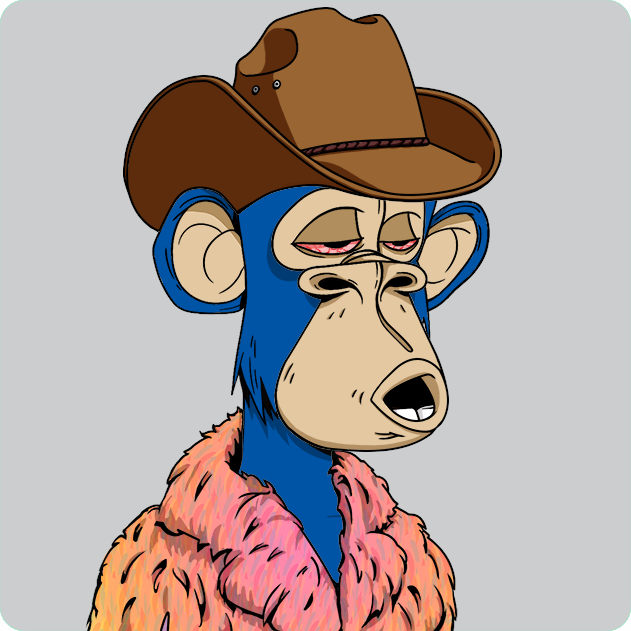

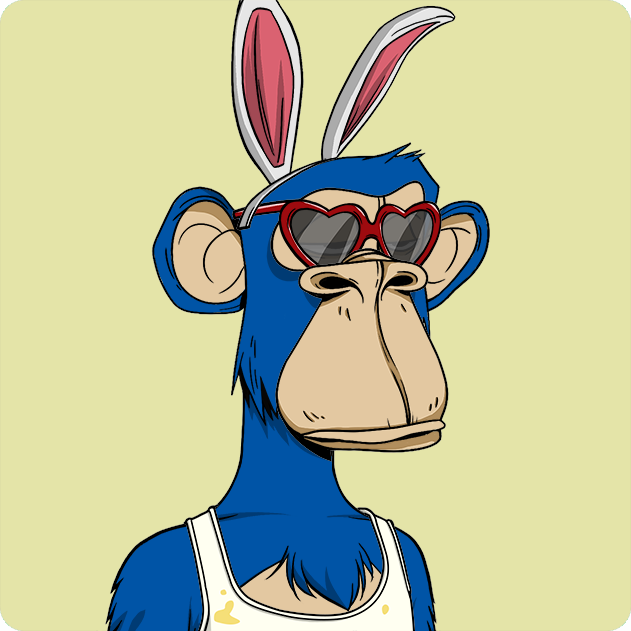

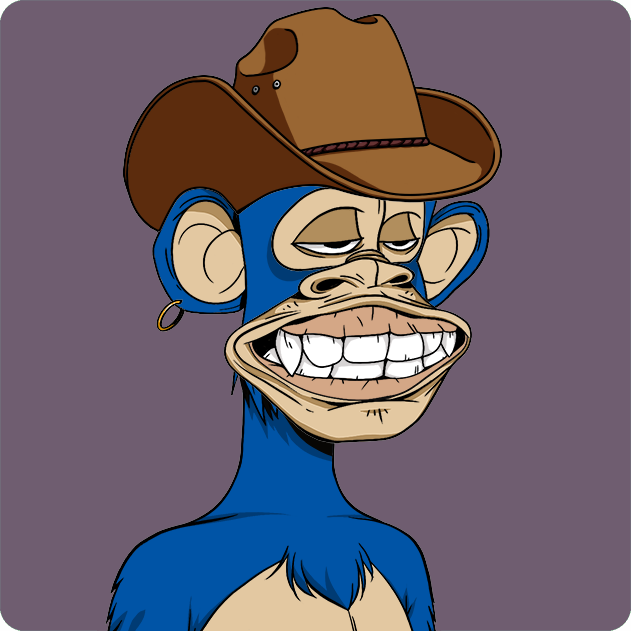

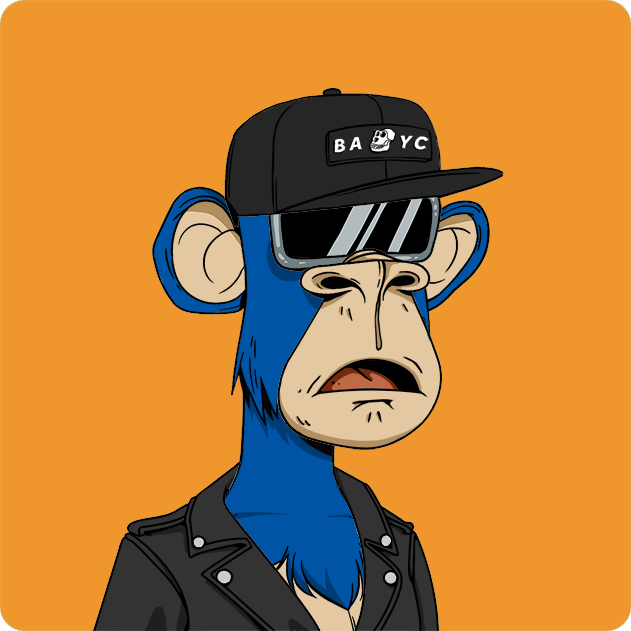

CPU times: user 54.3 ms, sys: 3.04 ms, total: 57.3 ms
Wall time: 211 ms


In [51]:
%%time
from IPython.display import Image
query = 'blue fur'
results = client.index(index_name).search(query, 
                                          device=device,
                                         )


for i in range(10):
    #print("RESULT: ", str(i))
    #print("URL: https://ipfs.io/ipfs/" + results['hits'][i]["_id"])
    display(Image("/home/ubuntu/apebase/ipfs/" + results['hits'][i]["_id"] + ".png", width=200))

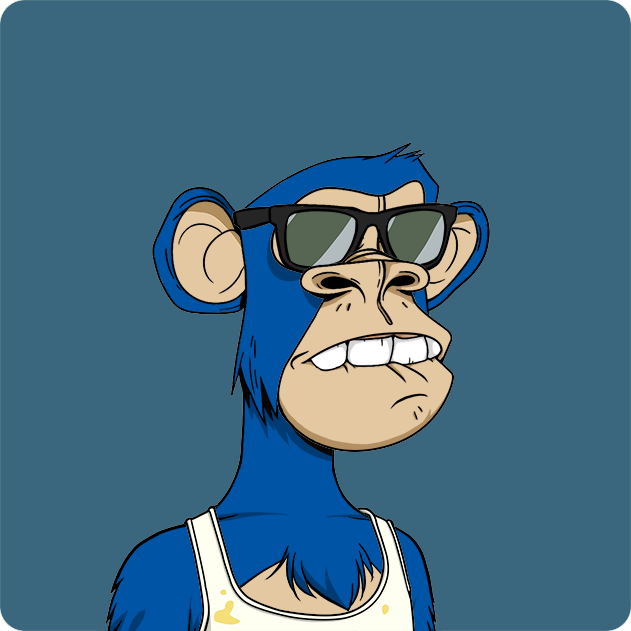

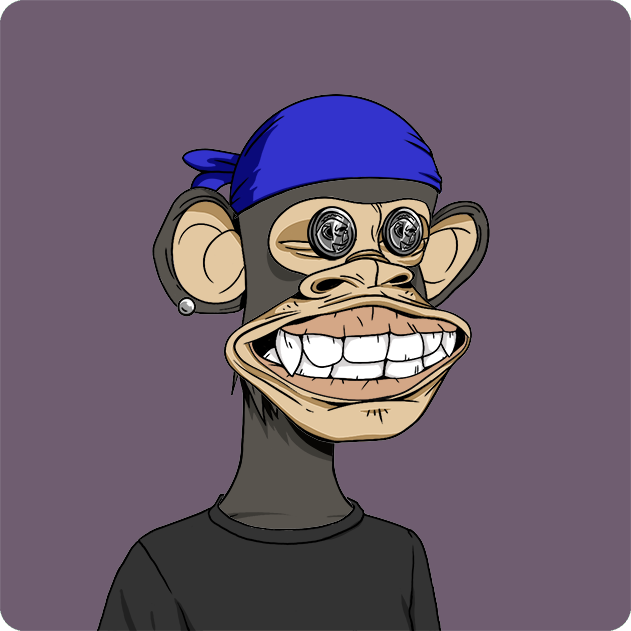

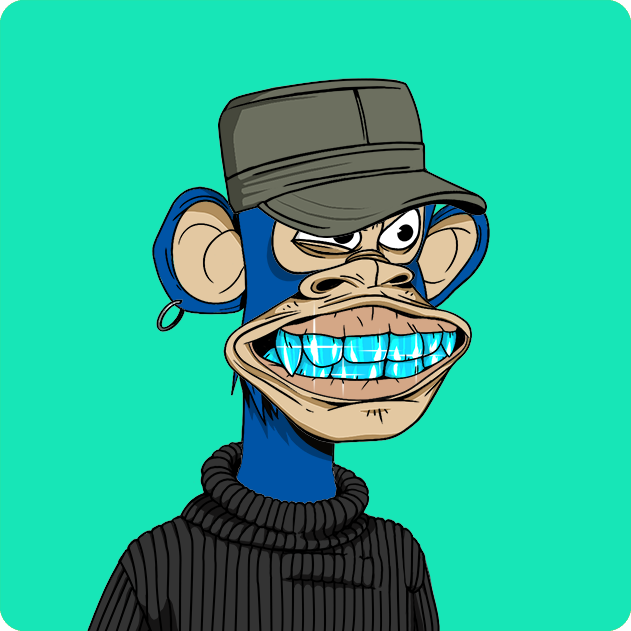

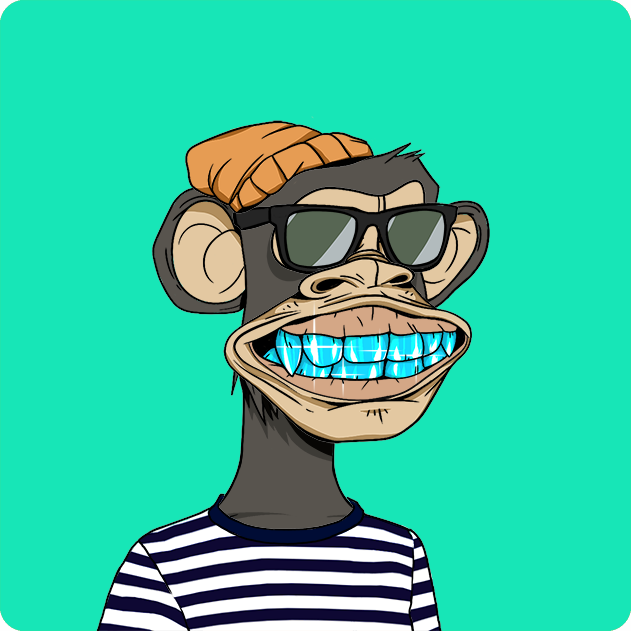

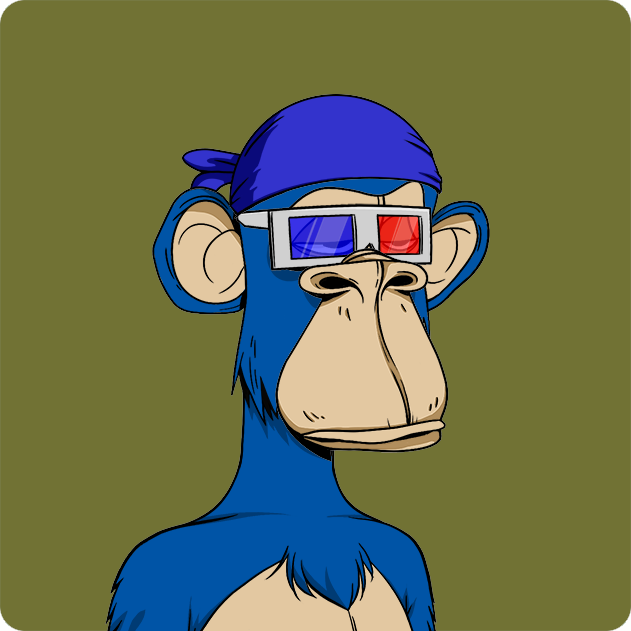

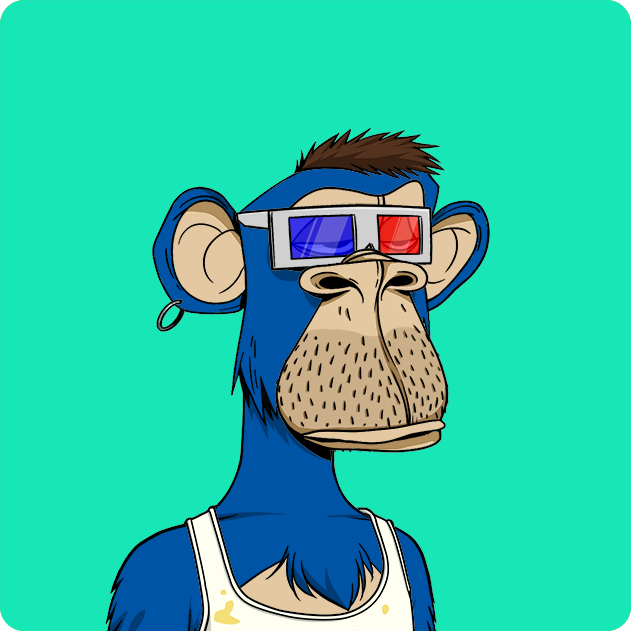

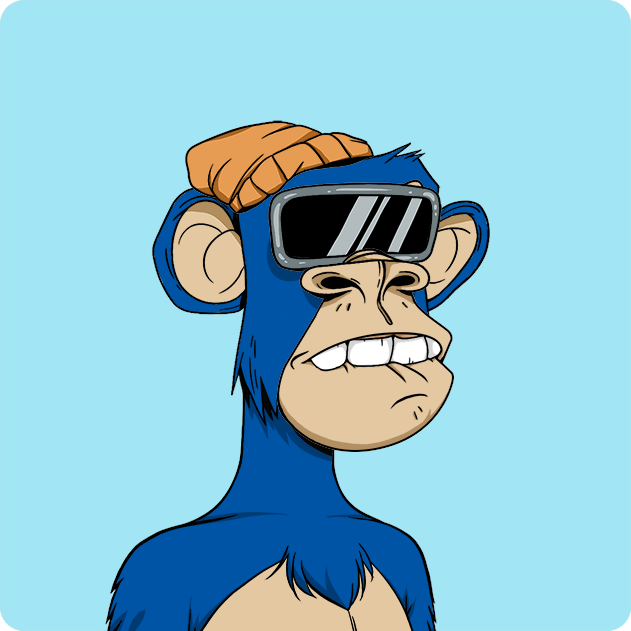

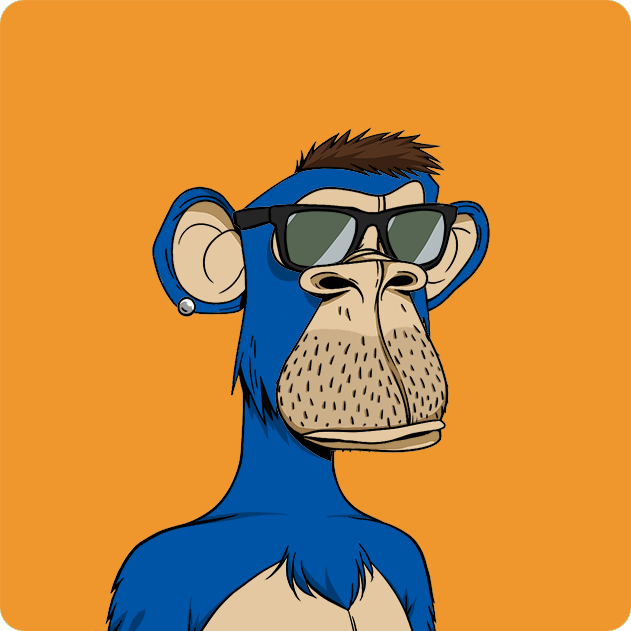

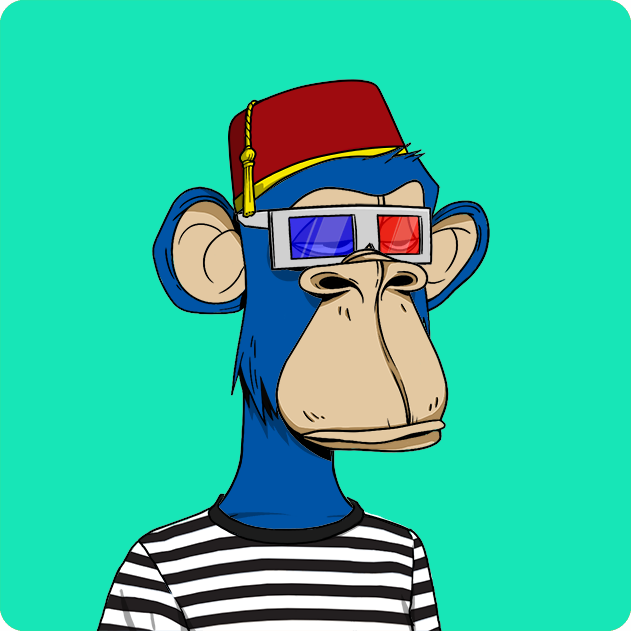

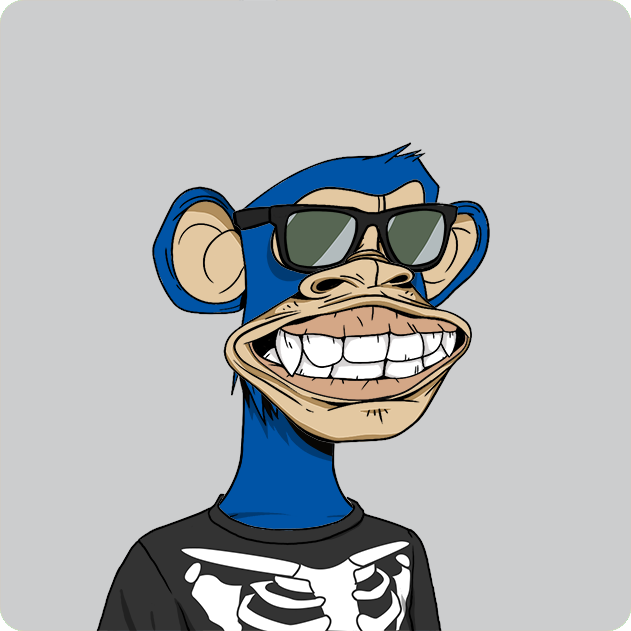

CPU times: user 55.8 ms, sys: 4.38 ms, total: 60.2 ms
Wall time: 222 ms


In [52]:
%%time
from IPython.display import Image
query = 'blue background'
results = client.index(index_name).search(query, 
                                          device=device,
                                         )


for i in range(10):
    #print("RESULT: ", str(i))
    #print("URL: https://ipfs.io/ipfs/" + results['hits'][i]["_id"])
    display(Image("/home/ubuntu/apebase/ipfs/" + results['hits'][i]["_id"] + ".png", width=200))

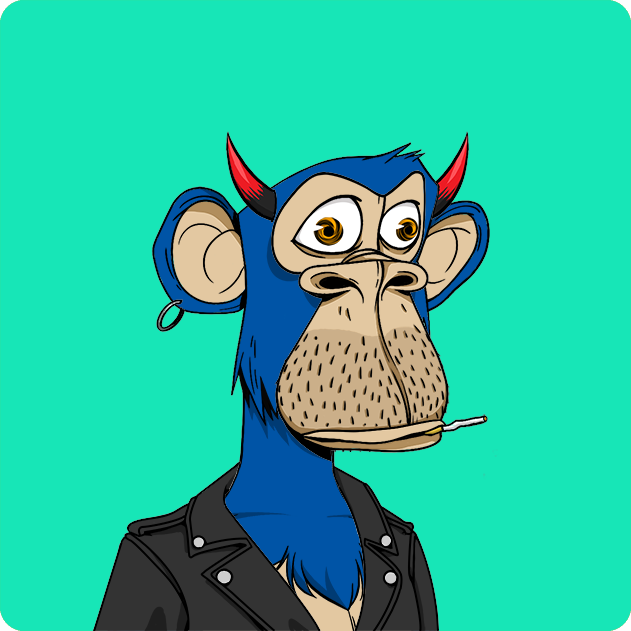

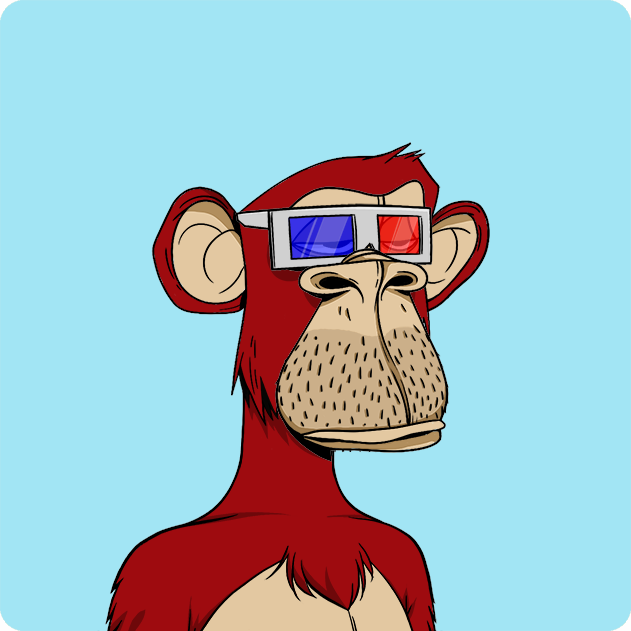

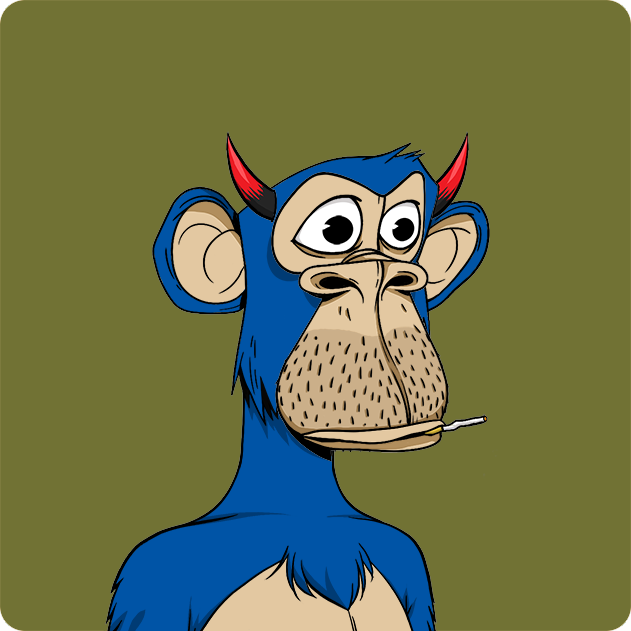

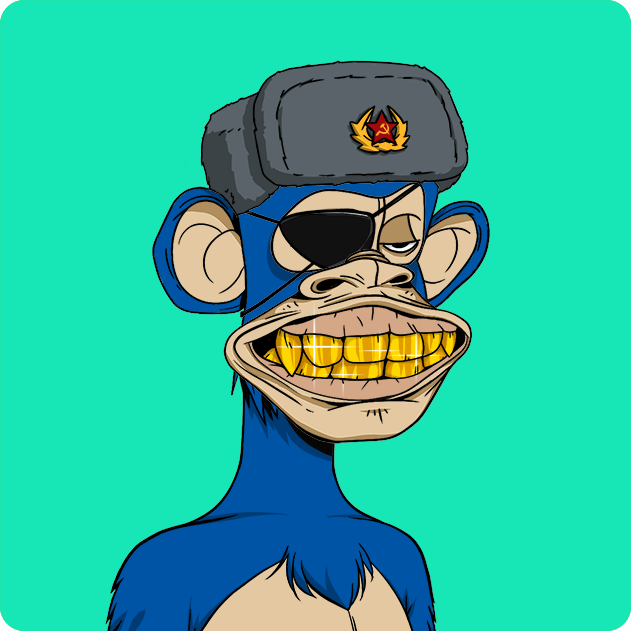

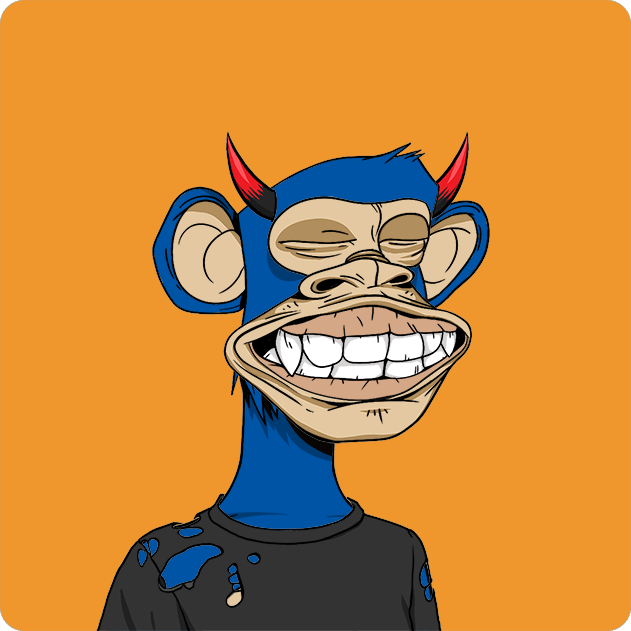

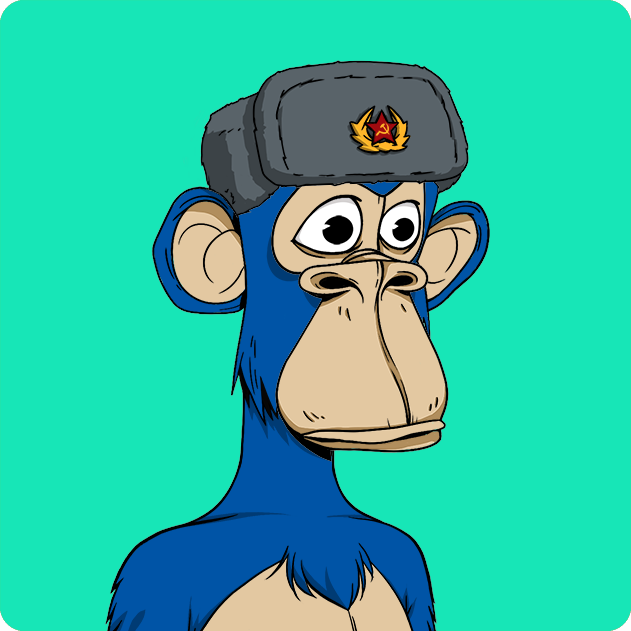

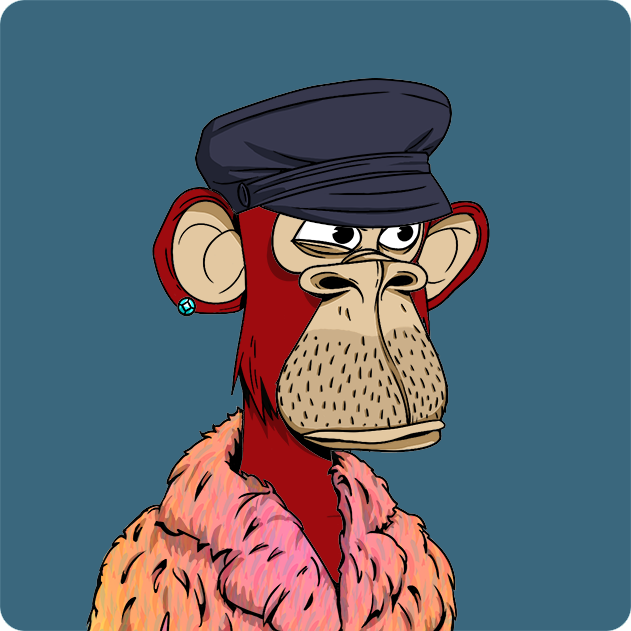

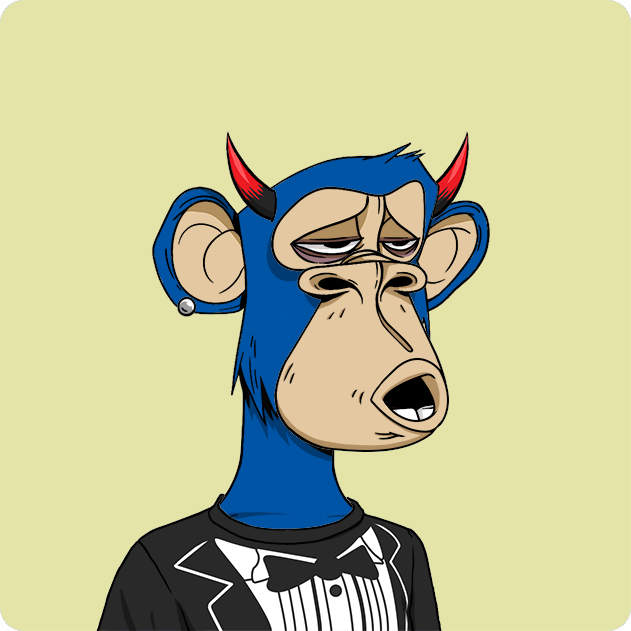

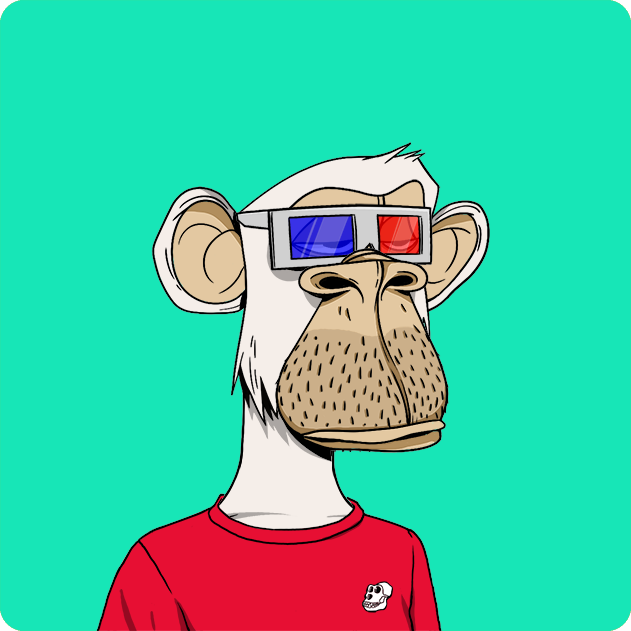

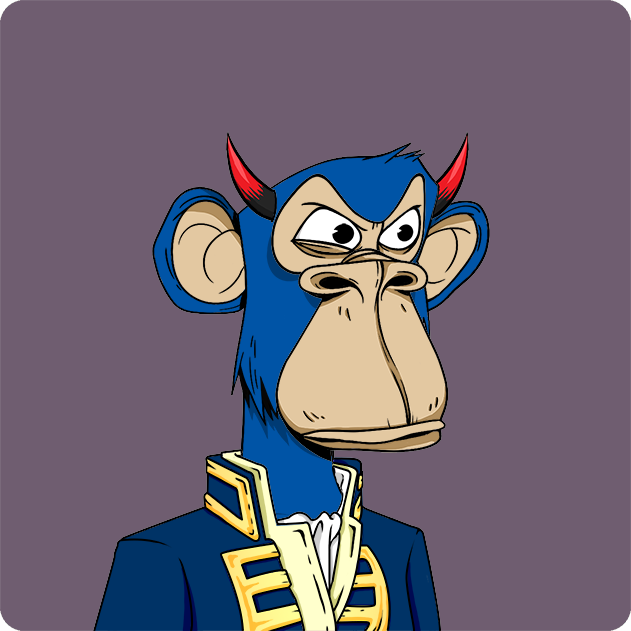

CPU times: user 37.7 ms, sys: 12.3 ms, total: 50 ms
Wall time: 214 ms


In [53]:
%%time
from IPython.display import Image
query = 'blue background with red fur'
results = client.index(index_name).search(query, 
                                          device=device,
                                         )


for i in range(10):
    #print("RESULT: ", str(i))
    #print("URL: https://ipfs.io/ipfs/" + results['hits'][i]["_id"])
    display(Image("/home/ubuntu/apebase/ipfs/" + results['hits'][i]["_id"] + ".png", width=200))

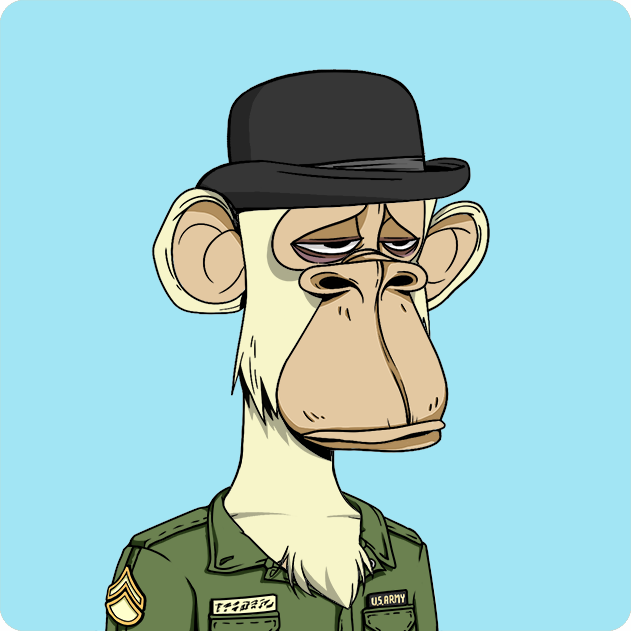

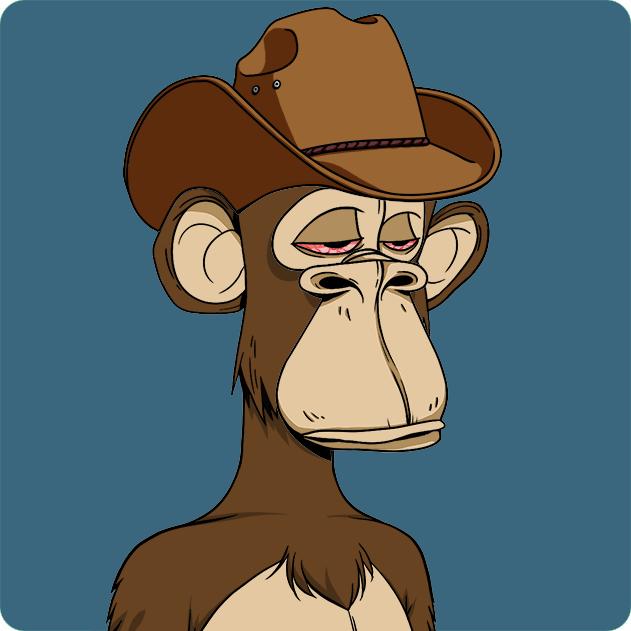

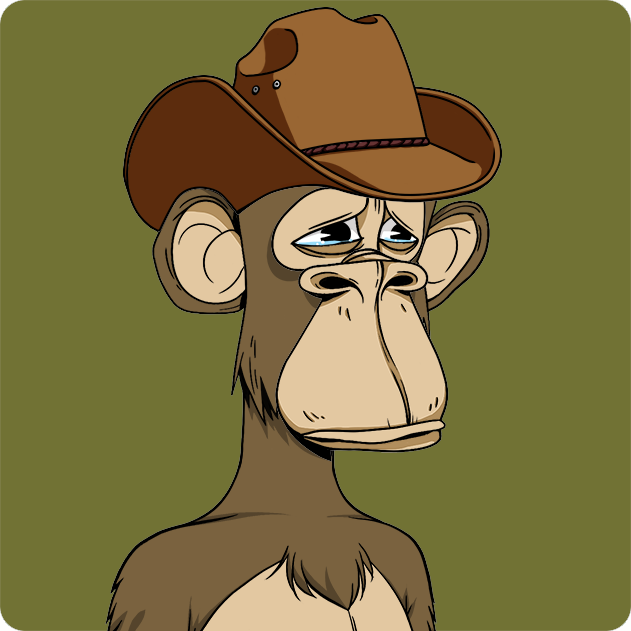

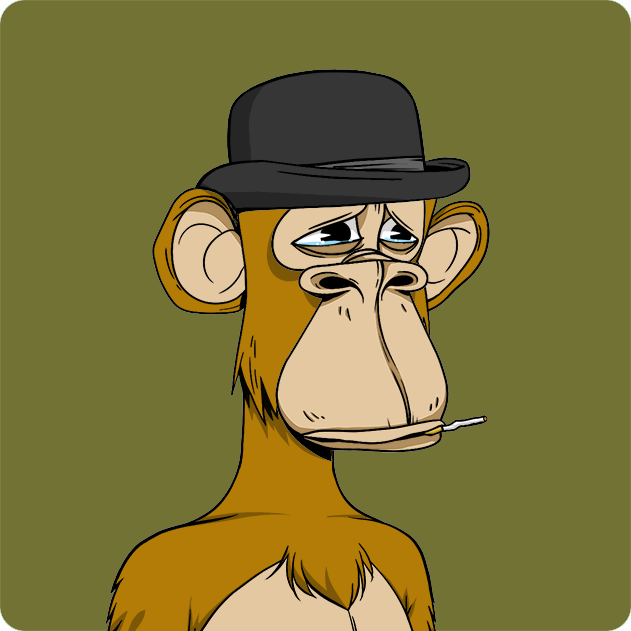

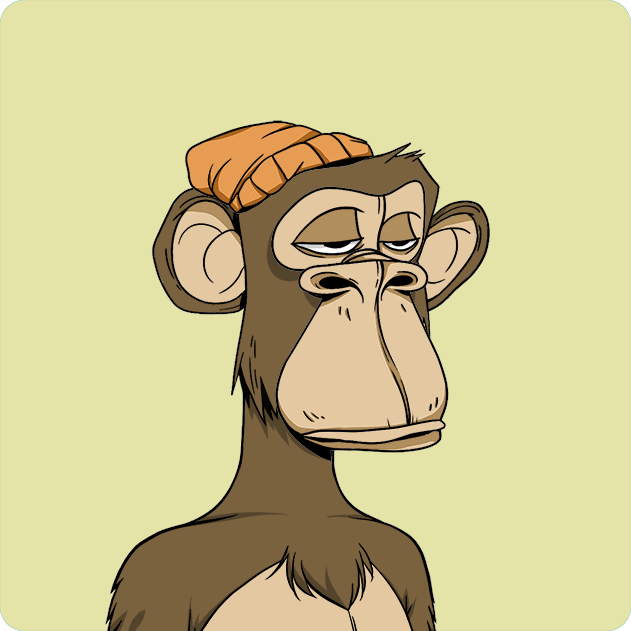

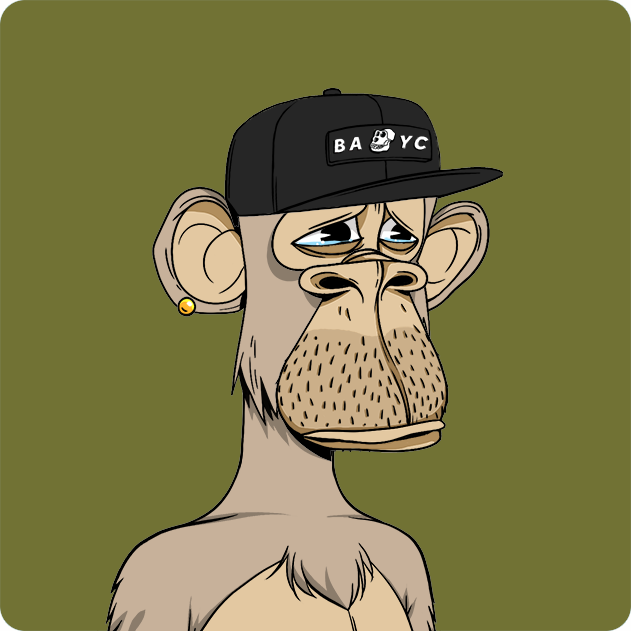

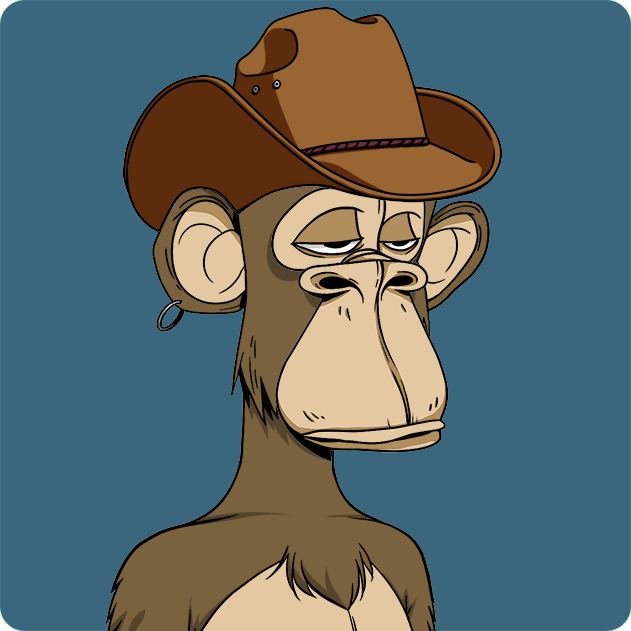

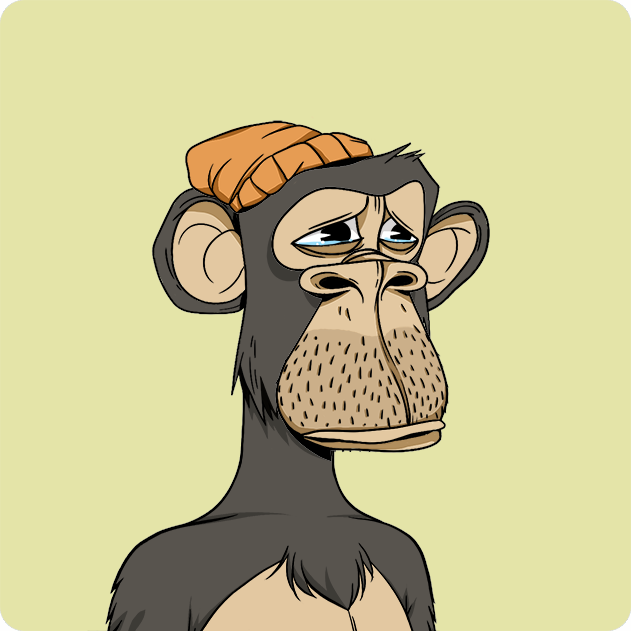

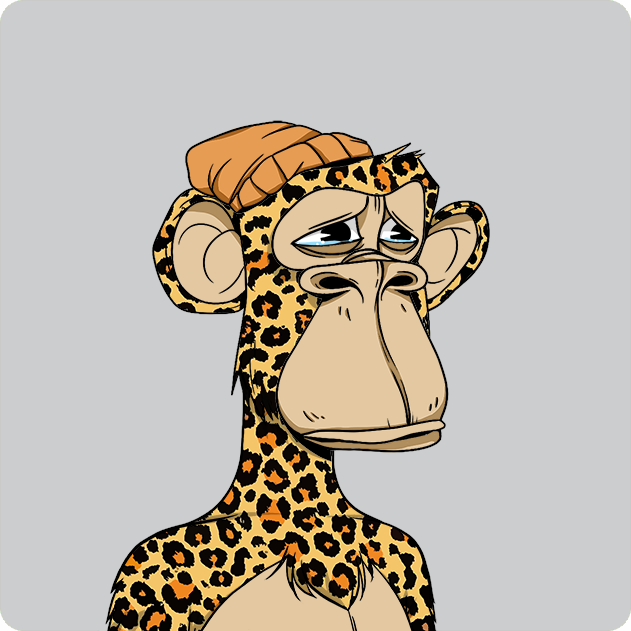

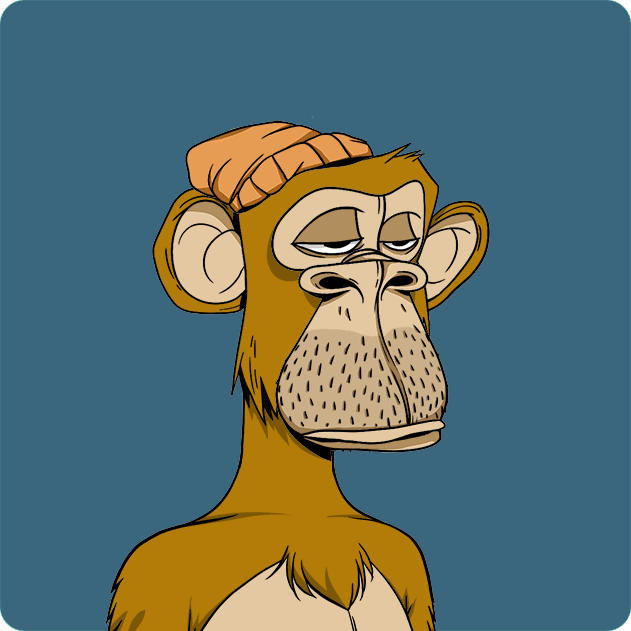

CPU times: user 61.2 ms, sys: 212 µs, total: 61.4 ms
Wall time: 250 ms


In [54]:
%%time
from IPython.display import Image
query = 'sad, wearing a hat, green fur'
results = client.index(index_name).search(query, 
                                          device=device,
                                         )


for i in range(10):
    #print("RESULT: ", str(i))
    #print("URL: https://ipfs.io/ipfs/" + results['hits'][i]["_id"])
    display(Image("/home/ubuntu/apebase/ipfs/" + results['hits'][i]["_id"] + ".png", width=200))

URL: https://ipfs.io/ipfs/QmTDC3t29FfpQomKk4HJJjf4LwDKpbmHGMSsMi49e7JakS


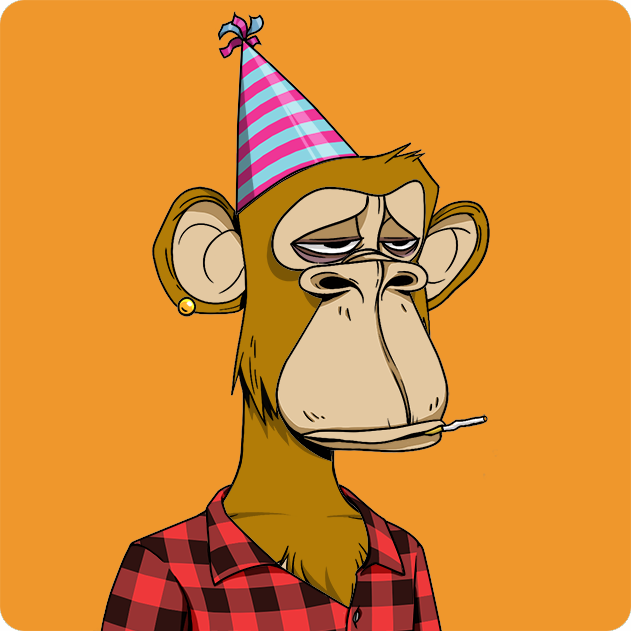

URL: https://ipfs.io/ipfs/QmdgHvC8FWMGG86Dq3Cqmux8JiPLRJfJApgHoELpTeL7fQ


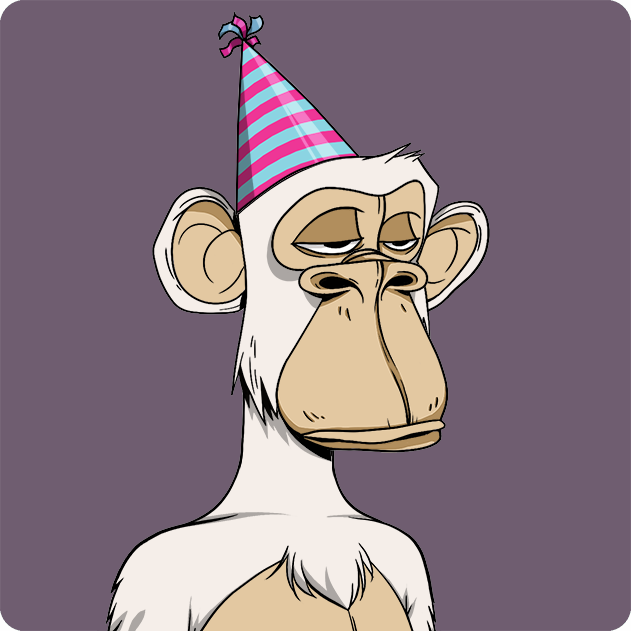

URL: https://ipfs.io/ipfs/QmVv5EYzcWKSgpdDE44i86dtjbGu9ey6ySHJpfUwcwTTnP


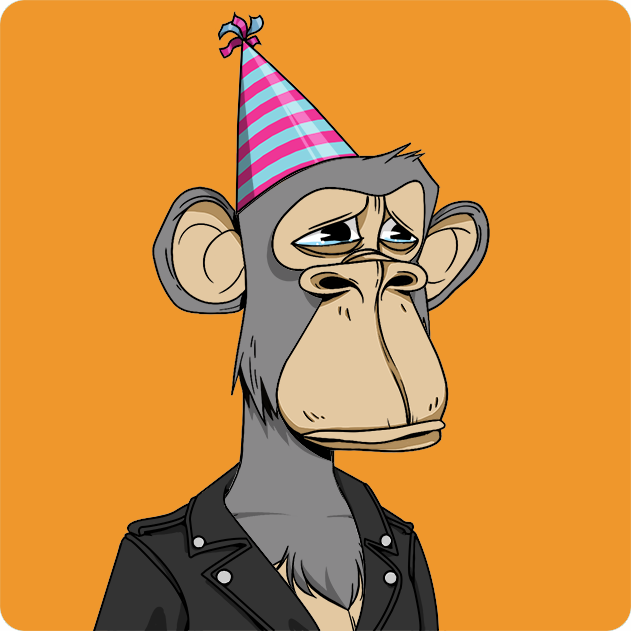

URL: https://ipfs.io/ipfs/QmVCFAbxuP3QFG25afR2QMSnpYyhMw5cJpLVtckS4PM4h1


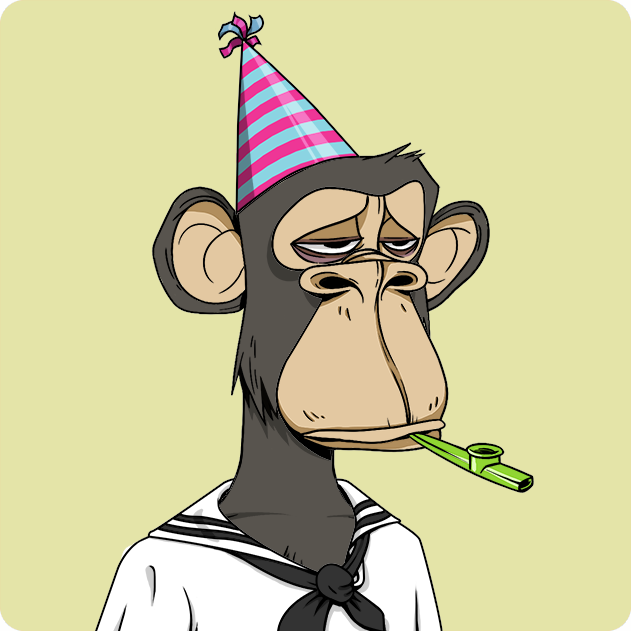

URL: https://ipfs.io/ipfs/QmXjYSzJqLFoLDKFKpDkJe25LEMRMhScb2b25e4C1gKbSt


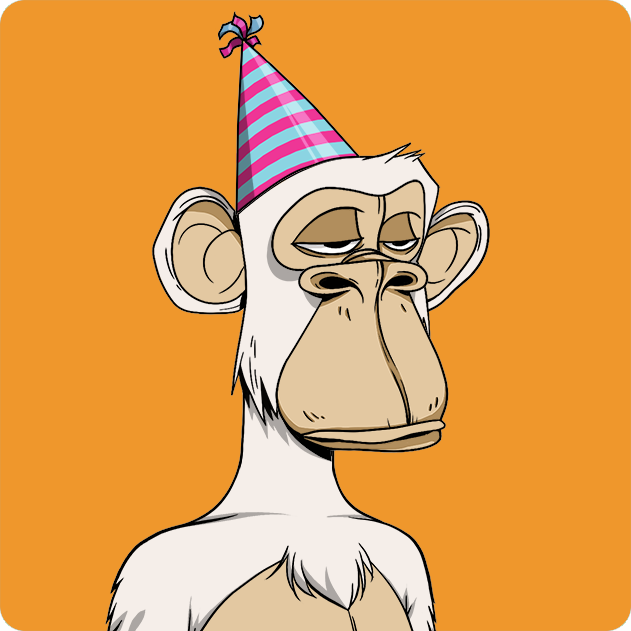

URL: https://ipfs.io/ipfs/QmPrDnRVSm32M1DWTA3zZr5CxMFVNNfh4VBBbGmFVME2pD


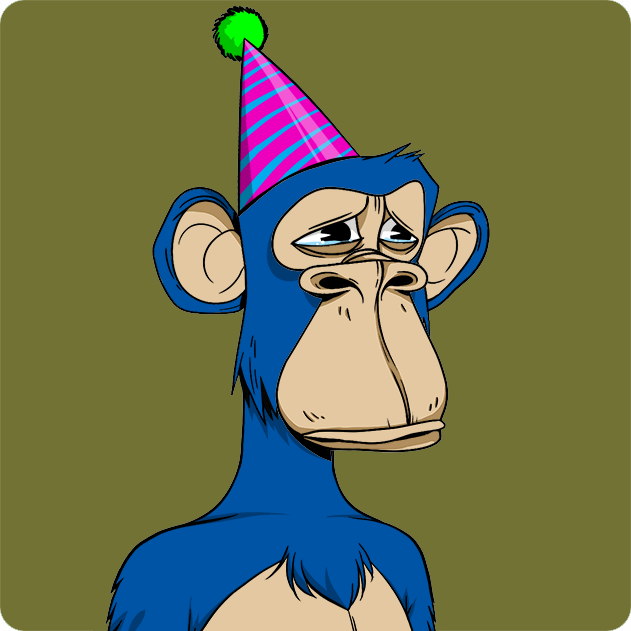

URL: https://ipfs.io/ipfs/QmPpE2kq66JCkztdEiaZvLXMoJaUDHjoFu82Nbi54BgqhD


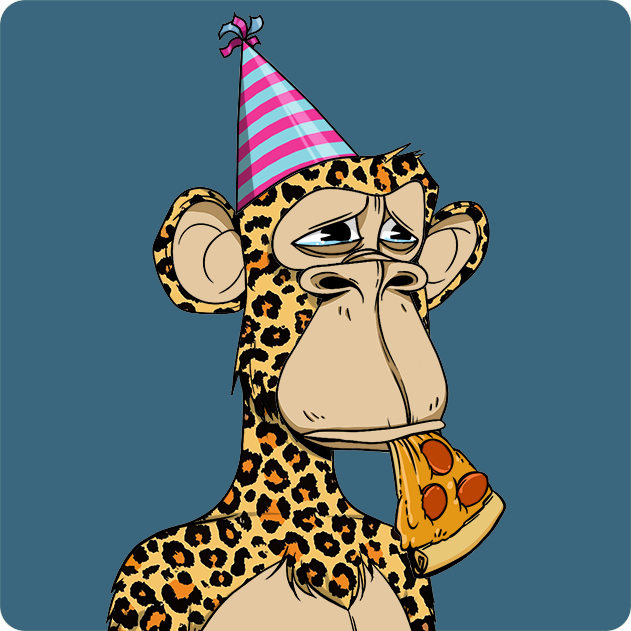

URL: https://ipfs.io/ipfs/QmNU3yNNq3uD5YrmcHjuTnUX8ED8LatGp4GBCqsfHAyGb6


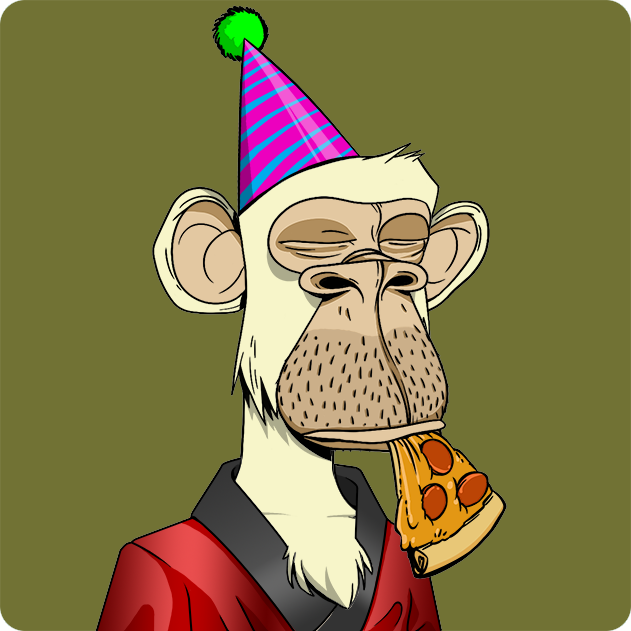

URL: https://ipfs.io/ipfs/QmNgTGkGdHhX7K6UfSASP1S1yPhumjmnZK3r1W9cBUzHf6


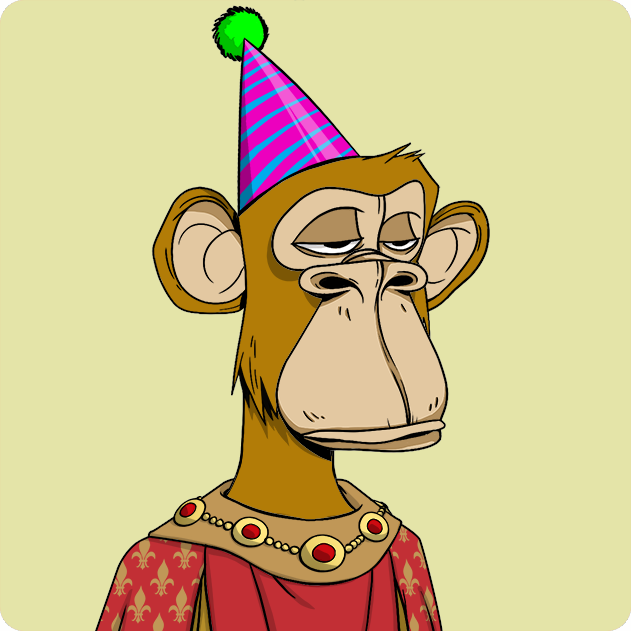

URL: https://ipfs.io/ipfs/QmWiTvGdQ5X6WW9J7uReHFJUVQt3tkqZUNKTTH8QKVg6r7


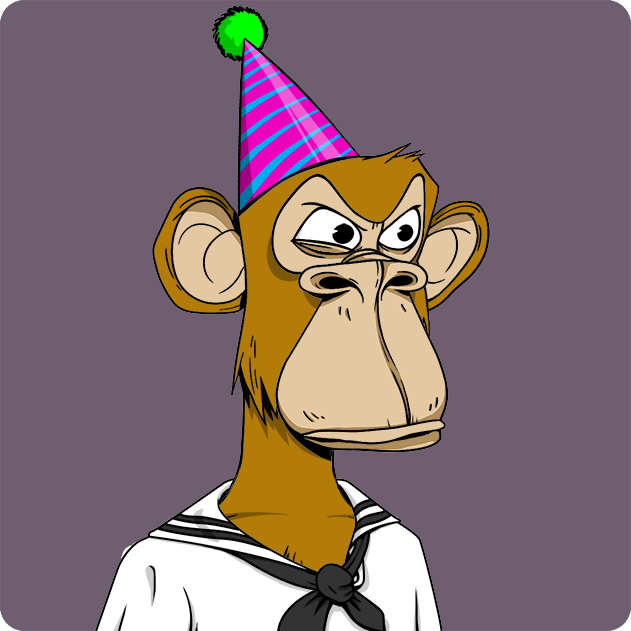

CPU times: user 55.1 ms, sys: 8.73 ms, total: 63.8 ms
Wall time: 310 ms


In [10]:
%%time
from IPython.display import Image
query = 'sad ape wearing a birthday hat'
results = client.index(index_name).search(query, 
                                          device=device,
                                         )


for i in range(10):
    #print("RESULT: ", str(i))
    print("URL: https://ipfs.io/ipfs/" + results['hits'][i]["_id"])
    display(Image("/home/ubuntu/apebase/ipfs/" + results['hits'][i]["_id"] + ".png", width=200))

In [42]:
import os

def add_extension_to_files(folder_to_rename, extension):
    img_list = os.listdir(folder_to_rename)
    for img in img_list:
        print(img)
        if img.split(".")[-1] != extension: 
            src = folder_to_rename + "/" + img
            dst = src + "." + extension
            os.rename(src, dst)

add_extension_to_files("/home/ubuntu/apebase/ipfs", "png")    

QmYAB1LmcCTbbsxJ52dVa4aHmJRie8J7LYVL2A1wDCEkGG.png
QmNPXVYfwRKEXvoLHFGAV1DSSuwfuDrhhKkK5XxNb3dkD5.png
QmX2bLgKCp4yoHhTTyBwpehiP5QwjMmBZXamMVWcVfyK2h.png
QmdkUMQ9VbyqqNgFcGFrocCxvavqcPQsedLDRAozTrMUyN.png
QmRAV9xSsQFqrdANdUxYeMqwbYV9q45NMrM8ZKkmbrhqbs.png
QmYt5B998yVFCPXNQsuBvqz1ffLQMzW8YhWZrANtA5KyLY.png
QmdR1CMpNT1ZEHm2FRPXgnNMBfqKQjkt9eMGcqvZKd1pT8.png
QmXLfR3g53gPgW4YNng7WokhK2F3c6beaoQmNenbVoq9VV.png
QmTZtS7TebzGF4ZKCrB38MvTGRCWPTP3w6Sr9aytGqDhfh.png
Qme5V4Gsvf2PWv3ZGLHyG2VYfJdNAVdvfEnrtQ1UmN5QUv.png
QmTzFMfUpwY3yvzCE7DvoCXVkYv2ph9M4JpyM44BeepxtR.png
QmbVKz2KF2UUbDnNWhrGm68x5e9Y1nitoxeVb8cXy6qhp7.png
QmW1m1otzGXwdaRTcNAHSsLhEMnZKShpGkZ4Vyo5f5BYpw.png
QmSn5wkNNbAE9gMxxEVwdRFnqQ4DHpcMzcT79AcNjMTbiM.png
QmQFPMWdh4Ehqj5oLX6VGz5un9pLq6aTiWAjv22e1Rswux.png
QmYxcK4sBSNJ8gEnpF5Hvh5SvwogagJxB6AoxgZBYB8cAB.png
QmR7Es764azCQBm1nFaqFrGQoqfqqQMXB14PoXH18AC3N2.png
QmTC3AjjSzeddbp8pMMEgYQhhcrH3qzMr1J4PmyUHL2V6Z.png
QmXDqotm6DamxnpdBN3Arr31p5sKPeSRVuQ7CCzAzARHwC.png
QmaK6khxMnG2cddBLpsxidwYEfzcD6X

In [39]:
base_folder = "~/apebase/ipfs/"
_id = "QmTDxLZwa4rk5Cuu95JVDuwW69rkbWxgoXGn71quZehB4t"

from IPython.display import Image, display

listOfImageNames = [base_folder + _id]

for imageName in listOfImageNames:
    display(Image(filename=imageName))

ValueError: Cannot embed the '~/apebase/ipfs/wefwe/qmtdxlzwa4rk5cuu95jvduww69rkbwxgoxgn71quzehb4t' image format

In [38]:
import IPython

for i in range(10):
    print("RESULT: ", str(i))
    
    url = "https://ipfs.io/ipfs/" + results['hits'][i]["_id"]
    print("URL: ", url)
    IPython.display.Image(url, width = 250)

RESULT:  0
URL:  https://ipfs.io/ipfs/QmTDxLZwa4rk5Cuu95JVDuwW69rkbWxgoXGn71quZehB4t


ValueError: Cannot embed the 'https://ipfs.io/ipfs/qmtdxlzwa4rk5cuu95jvduww69rkbwxgoxgn71quzehb4t' image format